In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import scipy.io as scp
import os

In [2]:
###Define colors code for plots:
from matplotlib import cm

##Get colors : 
cmap_name1 = cm.get_cmap('tab20', 20)
cmap_name2 = cm.get_cmap('tab20b', 20)
cmap_name3 = cm.get_cmap('tab20c', 20)
cmap_name4 = cm.get_cmap('tab10', 10)
cmap_name5 = cm.get_cmap('Set3', 12)

cmap1 = cmap_name1(np.linspace(0, 1, 20))
cmap2 = cmap_name2(np.linspace(0, 1, 20))
cmap3 = cmap_name3(np.linspace(0, 1, 20))
cmap4 = cmap_name4(np.linspace(0, 1, 10))
cmap5 = cmap_name5(np.linspace(0, 1, 12))

cmap = np.vstack([cmap1, cmap2, cmap3, cmap4, cmap5, 
                  cmap1, cmap2, cmap3, cmap4, cmap5, 
                  cmap1, cmap2, cmap3, cmap4, cmap5,
                  cmap1, cmap2, cmap3, cmap4, cmap5,
                  cmap1, cmap2, cmap3, cmap4, cmap5])
print(len(cmap))

410


In [3]:
######Load:

####Raw data:
#path_to_df0 = "/Users/claire/Desktop/new_all_run_files_for_etas/catalog_all/"
path_to_df0 = "/home/xianglo/Bureau/DATA_AMATRICE/DBSCAN_David/new_all_run_files_for_etas/catalog_all/"
df0 = pd.read_csv(path_to_df0+'raw_data_modified_version.csv')
###Structure : t, x, y, z, m, x_km, y_km

df_swarms = pd.read_csv("/home/xianglo/Bureau/DATA_AMATRICE/DBSCAN_David/new_all_run_files_for_etas/v0_d03_n50_every1_clusters/df_final_swarms_of_v0_d03_n50_every1.csv")
df_swarms["swarm_number"] = np.arange(0, len(df_swarms))

####The final version of swarms dataframe:
#df_swarms = pd.read_csv("new_df_final_swarms_of_v0_d03_n50_every1.csv")
###Structure : t1, t2, x1, x2, y1, y2, z1, z2, dbscan_cluster where x1,x2,y1,y2 in° and z1,z2 in km

print("Total swarms = ", len(df_swarms))

df_swarms

Total swarms =  41


,t1,t2,x1,x2,y1,y2,z1,z2,num_EQ,swarm_number
0,13.534078,16.936724,42.763,42.771,13.153,13.163,5.301,6.640,31,0
1,21.189318,23.352065,42.512,42.518,13.414,13.421,9.786,10.828,30,1
2,31.959698,34.152999,42.905,42.914,13.173,13.183,4.573,5.337,52,2
3,33.400373,35.318887,42.766,42.773,13.219,13.227,6.343,7.093,97,3
4,43.213940,47.283527,42.896,42.905,13.219,13.228,2.722,3.792,50,4
5,54.623879,57.830113,42.632,42.653,13.287,13.310,6.468,7.906,27,5
6,56.921319,57.148958,42.863,42.881,13.066,13.090,1.165,3.237,114,6
7,72.571283,76.237535,42.523,42.529,13.451,13.464,9.863,11.278,124,7
8,82.026167,86.479576,42.763,42.770,13.101,13.110,4.584,5.328,162,8
9,89.020661,90.444182,42.458,42.473,13.239,13.256,6.073,7.706,175,9


In [4]:
###Clusters from dbscan:
v0_n50_d0_3 = scp.loadmat("/home/xianglo/Bureau/DATA_AMATRICE/DBSCAN_David/new_all_run_files_for_etas/dbscan_data/v0_d03km_n50_every1.mat")["clusters"].reshape(-1) ##au moins 50 séismes à < 300 m, v = 0km/d : 1 séisme sur 1 comme vertex

###Add columns:
df0["dbscan"] = v0_n50_d0_3

df0.head()

,t,x,y,z,m,x_km,y_km,dbscan
0,0.004465,42.99118,12.92042,4.107,0.547416,4780.401106,1050.875824,2.0
1,0.024991,42.30519,13.68531,6.154,0.964305,4704.122499,1125.431260,-0.0
2,0.028414,43.52994,12.65680,14.826,0.025395,4840.308485,1020.365169,-0.0
3,0.030136,43.16713,12.99694,8.917,-0.127835,4799.965854,1054.068313,-0.0
4,0.043938,43.31555,12.55297,3.274,-0.889339,4816.469405,1015.584715,-0.0


In [5]:
######Assign EQ to swarms:
###Create a column of swarms number:
df0["swarms_num"] = np.zeros(len(df0)) -1


for i in range(0, len(df_swarms)):
    select_swarms = df0.index[(df0.t >= df_swarms.t1.iloc[i])&(df0.t <= df_swarms.t2.iloc[i])
                       & (df0.x >= df_swarms.x1.iloc[i])&(df0.x <= df_swarms.x2.iloc[i])
                       & (df0.y >= df_swarms.y1.iloc[i])&(df0.y <= df_swarms.y2.iloc[i])
                       & (df0.z >= df_swarms.z1.iloc[i])&(df0.z <= df_swarms.z2.iloc[i])]
    
    df0.swarms_num.iloc[select_swarms] = i
    
    
df0['swarms_num'] = df0['swarms_num'].astype('int')
print(df0["swarms_num"].max()+1)

###Remove all rows with a magnitude equal to a nan value:
df0 = df0.dropna()

df0.index = np.arange(0, len(df0))

df0

41


,t,x,y,z,m,x_km,y_km,dbscan,swarms_num
0,0.004465,42.99118,12.92042,4.107,0.547416,4780.401106,1050.875824,2.0,-1
1,0.024991,42.30519,13.68531,6.154,0.964305,4704.122499,1125.431260,-0.0,-1
2,0.028414,43.52994,12.65680,14.826,0.025395,4840.308485,1020.365169,-0.0,-1
3,0.030136,43.16713,12.99694,8.917,-0.127835,4799.965854,1054.068313,-0.0,-1
4,0.043938,43.31555,12.55297,3.274,-0.889339,4816.469405,1015.584715,-0.0,-1
...,...,...,...,...,...,...,...,...,...
894438,365.996726,42.81393,13.10829,7.216,-0.325824,4760.691806,1069.225754,233.0,-1
894439,365.997166,42.80558,13.14988,3.126,0.304970,4759.763328,1072.763006,-0.0,-1
894440,365.997419,43.00835,13.14668,1.336,-0.183670,4782.310323,1068.979802,225.0,-1
894441,365.999614,42.66073,13.21744,4.262,-0.273458,4743.656743,1080.795874,-0.0,-1


In [31]:
from AVN import *

###Define AVN MS:
A, V, N, df_AVN = AVN(df0)
C = df0[(df0.m >= 5)&(df0.t >= 156)]

###Define EQ m >= 5: ##associated to gold color
df0_m5 = df0[df0.m >= 5]

df_AVN

,t,x,y,z,m,x_km,y_km,dbscan,swarms_num,xN_km,yN_km
621,9.067054,42.71446,13.24279,3.276,6.046692,4749.631246,1081.932511,-0.0,-1.0,-13.517967,12.027283
184899,72.804244,42.91094,13.13936,2.605,5.576763,4771.478826,1070.077358,-0.0,-1.0,8.329612,0.172130
201811,76.277989,42.83603,13.12131,6.104,6.074127,4763.149214,1069.905228,233.0,-1.0,0.000000,0.000000


In [8]:
###Rescale on Norcia event:
xN_km = df0.x_km - N.x_km
yN_km = df0.y_km - N.y_km

df0["xN_km"] = xN_km
df0["yN_km"] = yN_km

###Define AVN MS:
A, V, N, df_AVN = AVN(df0)

###Define EQ m >= 5: ##associated to gold color
df0_m5 = df0[df0.m >= 5]

df0

,t,x,y,z,m,x_km,y_km,dbscan,swarms_num,xN_km,yN_km
0,0.004465,42.99118,12.92042,4.107,0.547416,4780.401106,1050.875824,2.0,-1,17.251893,-19.029404
1,0.024991,42.30519,13.68531,6.154,0.964305,4704.122499,1125.431260,-0.0,-1,-59.026715,55.526032
2,0.028414,43.52994,12.65680,14.826,0.025395,4840.308485,1020.365169,-0.0,-1,77.159272,-49.540059
3,0.030136,43.16713,12.99694,8.917,-0.127835,4799.965854,1054.068313,-0.0,-1,36.816640,-15.836915
4,0.043938,43.31555,12.55297,3.274,-0.889339,4816.469405,1015.584715,-0.0,-1,53.320191,-54.320513
...,...,...,...,...,...,...,...,...,...,...,...
894438,365.996726,42.81393,13.10829,7.216,-0.325824,4760.691806,1069.225754,233.0,-1,-2.457408,-0.679474
894439,365.997166,42.80558,13.14988,3.126,0.304970,4759.763328,1072.763006,-0.0,-1,-3.385886,2.857778
894440,365.997419,43.00835,13.14668,1.336,-0.183670,4782.310323,1068.979802,225.0,-1,19.161110,-0.925426
894441,365.999614,42.66073,13.21744,4.262,-0.273458,4743.656743,1080.795874,-0.0,-1,-19.492471,10.890646


In [13]:
###To define the correct name of the swarm:
df_stats = pd.read_csv("/home/xianglo/Bureau/DATA_AMATRICE/DBSCAN_David/new_all_run_files_for_etas/v0_d03_n50_every1_clusters/Saving_t_start_df/df_stats.csv")

df_stats.drop(['param1', 'T', 'i_stars', 'diff_m', 'skew', 'swarms_num'], axis=1)

,t1,t2,x1,x2,y1,y2,z1,z2,num_EQ,new_t1,dt1,t,dn,dbscan_cluster,swarm_number
0,13.534078,16.936724,42.763,42.770,13.154,13.163,5.301,6.640,31,10.690895,2.84,7.50,17,31,1
1,21.195346,23.248829,42.513,42.517,13.414,13.421,9.786,10.828,30,13.137280,8.06,13.75,8,30,2
2,31.968791,34.038095,42.906,42.913,13.175,13.182,4.601,5.337,52,30.820802,1.15,5.00,8,52,3
3,33.400871,35.318887,42.767,42.773,13.219,13.227,6.343,7.093,97,21.477573,11.92,2.50,5,97,4
4,43.213940,47.259175,42.897,42.905,13.220,13.226,2.824,3.764,50,39.503106,3.71,10.00,10,50,5
5,54.635766,57.825894,42.639,42.653,13.287,13.305,6.772,7.764,27,52.022877,2.62,7.50,55,27,6
6,56.923042,57.149496,42.867,42.878,13.070,13.081,1.467,3.049,114,56.203129,0.72,1.25,129,114,7
7,72.571283,76.237535,42.524,42.529,13.452,13.464,9.899,11.071,124,67.119588,5.45,11.25,13,124,8
8,82.026167,86.479576,42.763,42.769,13.103,13.109,4.584,5.328,162,55.126709,26.90,40.00,7,162,9
9,89.024916,90.439672,42.459,42.473,13.239,13.254,6.073,7.616,175,61.917275,27.10,36.25,42,175,10


max swarm = 40
n° 0 :
(swarm) duration= 3.402645196765663 d
f_dist = 5 km


/home/xianglo/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:93: UserWarning: Boolean Series key will be reindexed to match DataFrame index.


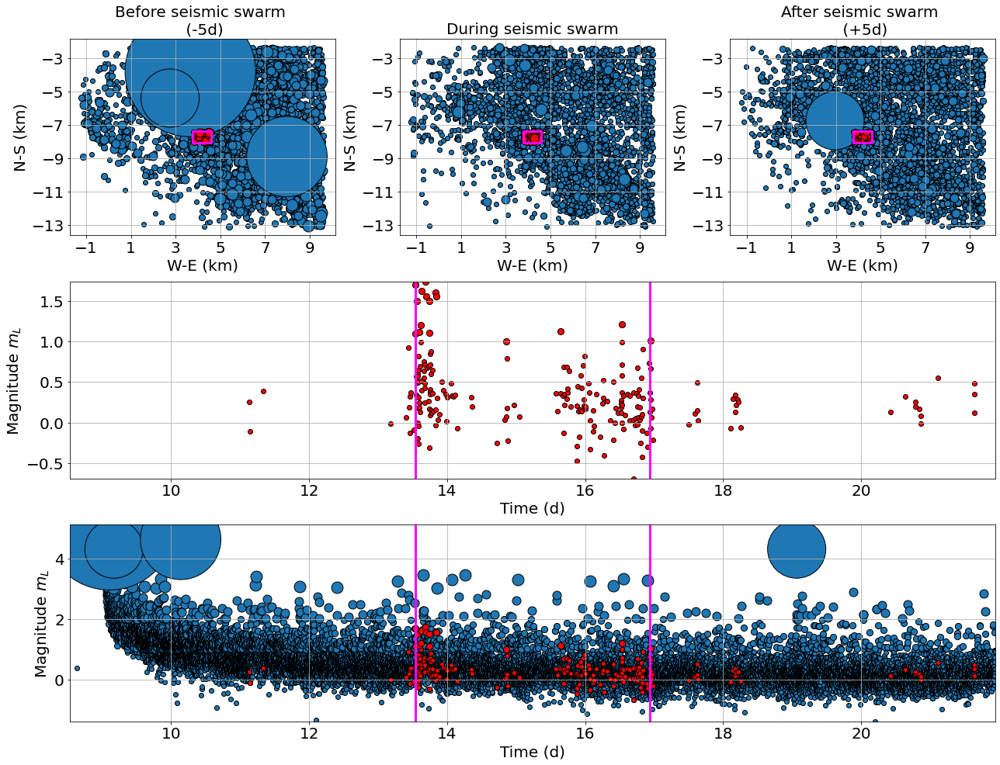

n° 1 :
(swarm) duration= 2.06682971061673 d
f_dist = 5 km


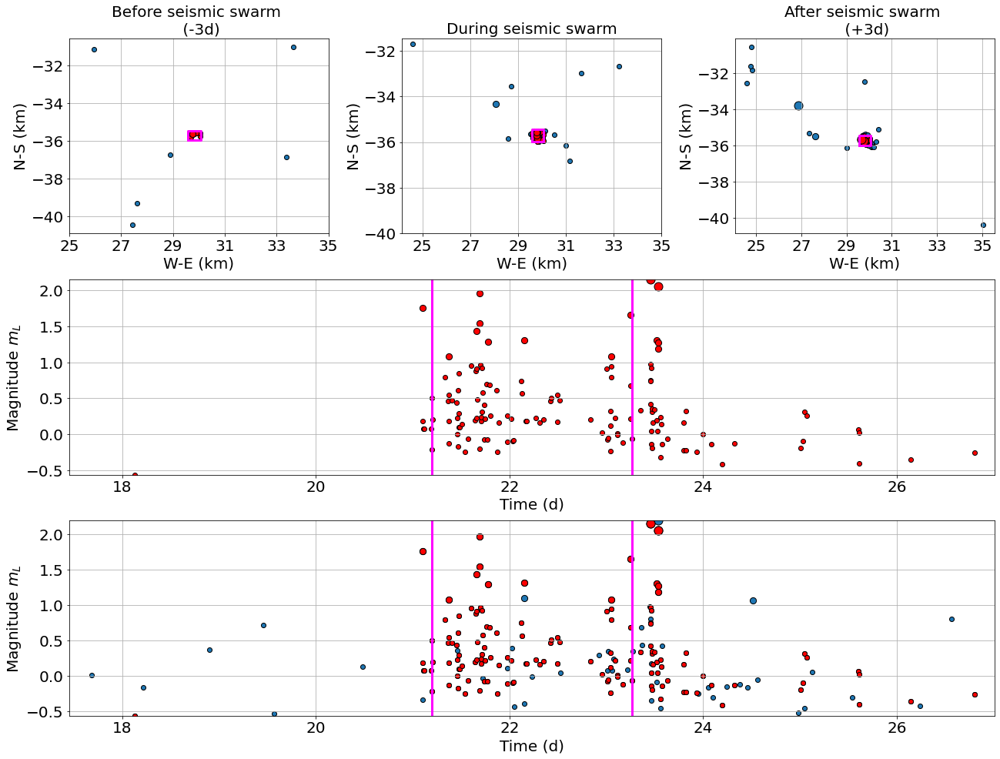

n° 2 :
(swarm) duration= 2.184207546291873 d
f_dist = 5 km


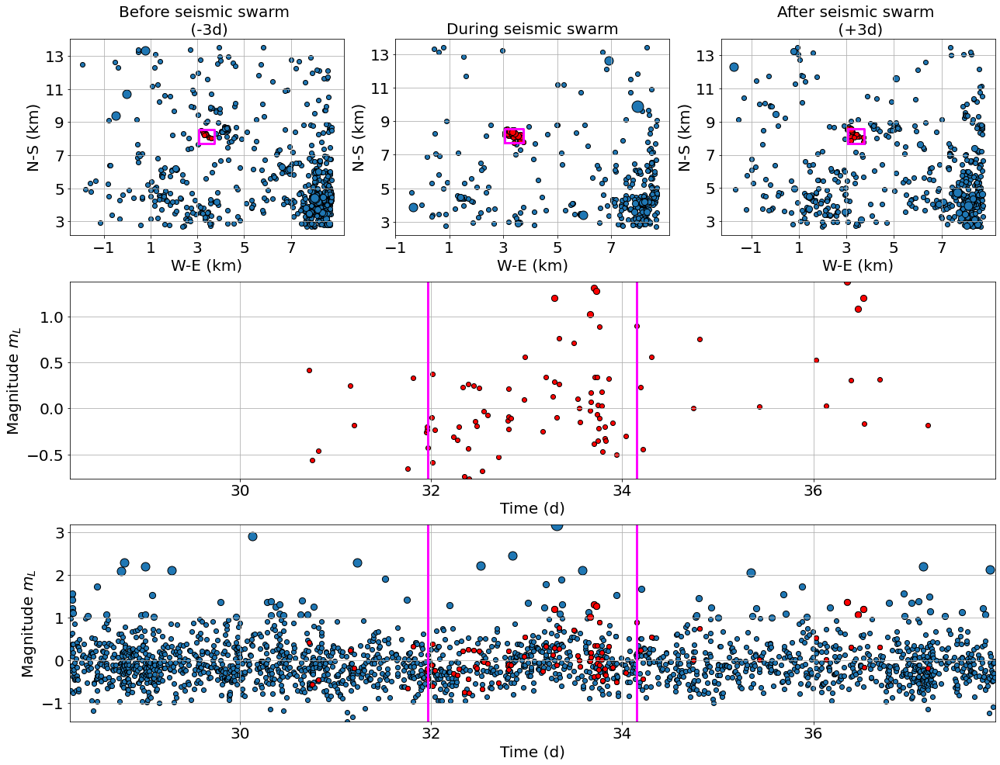

n° 3 :
(swarm) duration= 1.9180155787616968 d
f_dist = 5 km


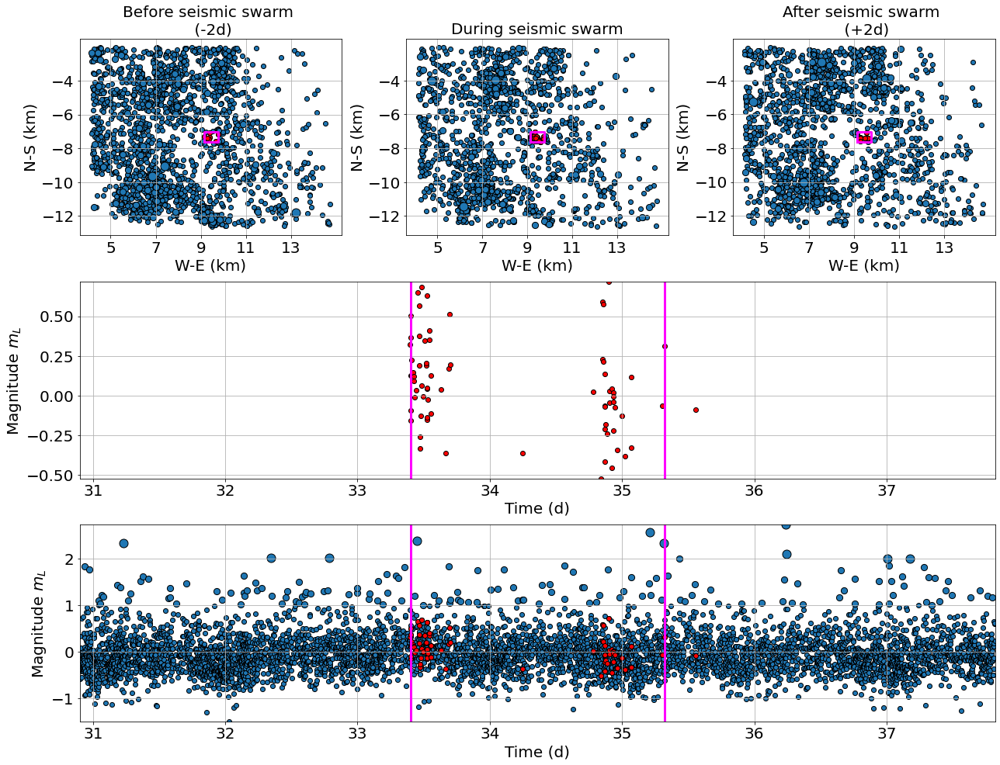

n° 4 :
(swarm) duration= 4.059576504630968 d
f_dist = 5 km


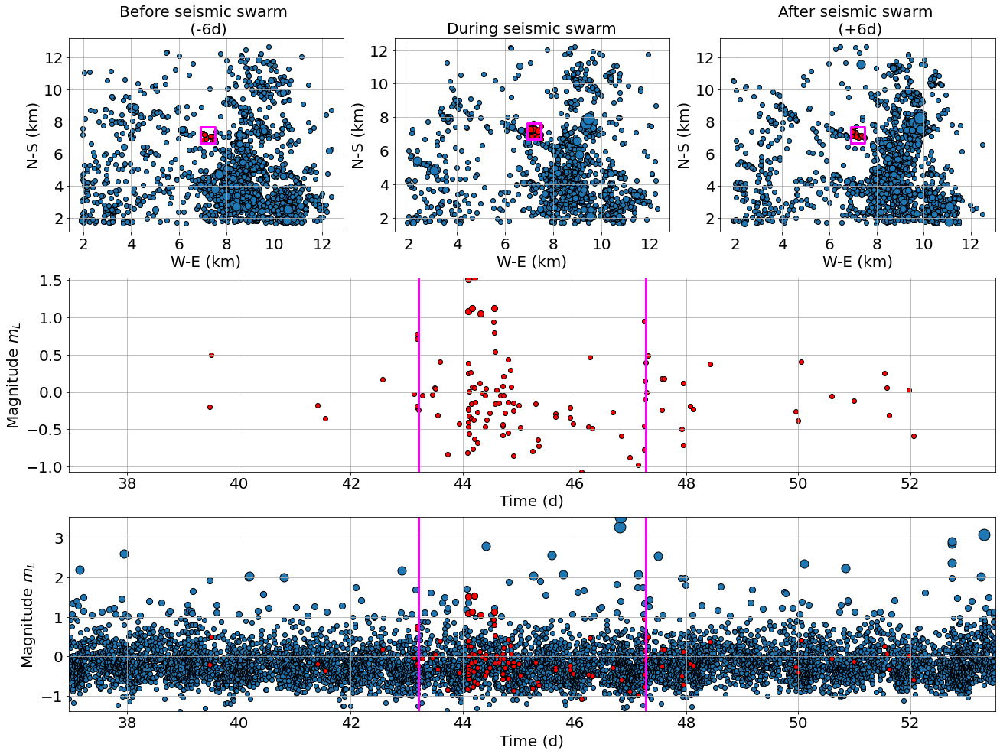

n° 5 :
(swarm) duration= 3.1943464466603473 d
f_dist = 5 km


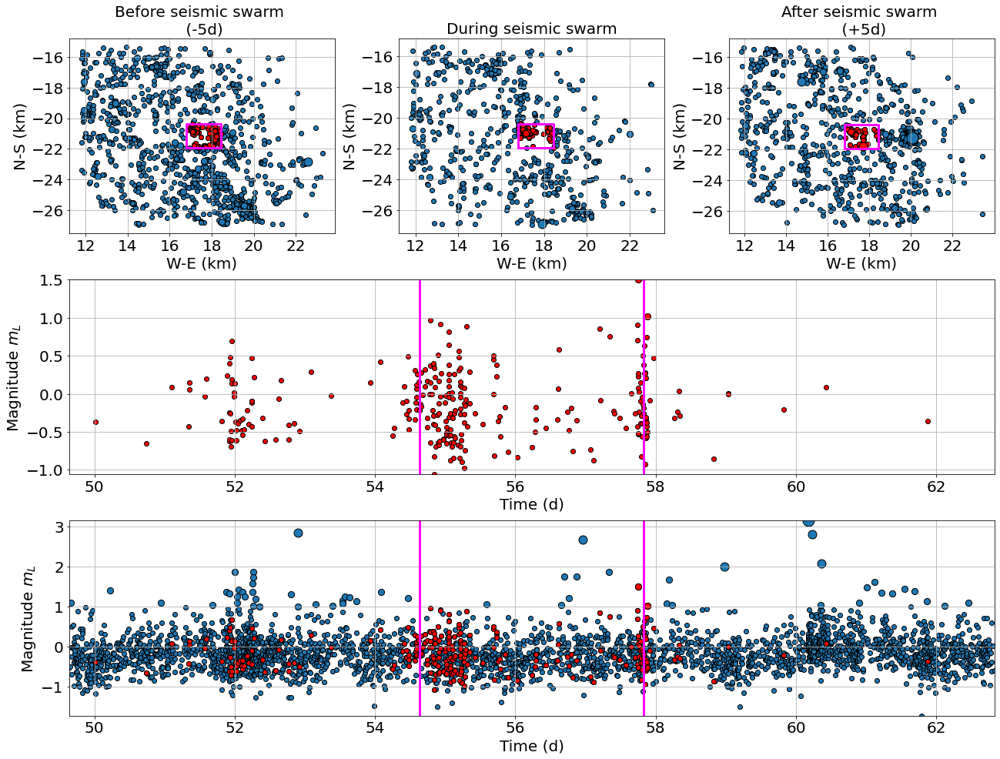

n° 6 :
(swarm) duration= 0.2259157175431028 d
f_dist = 5 km


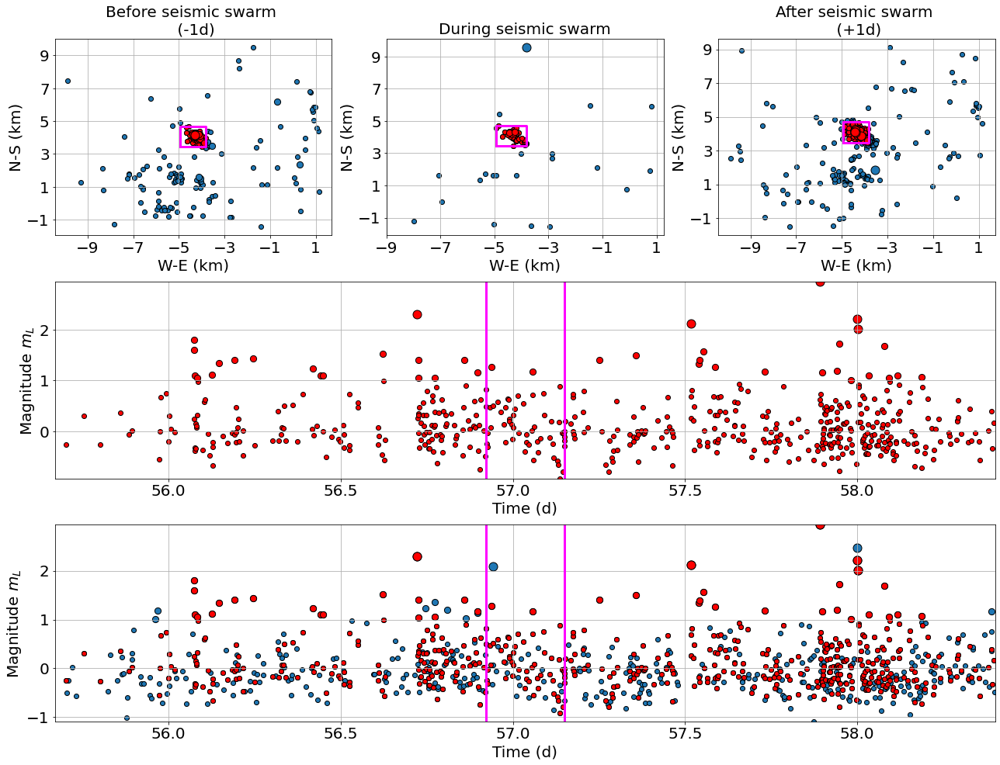

n° 7 :
(swarm) duration= 3.666251400485635 d
f_dist = 5 km


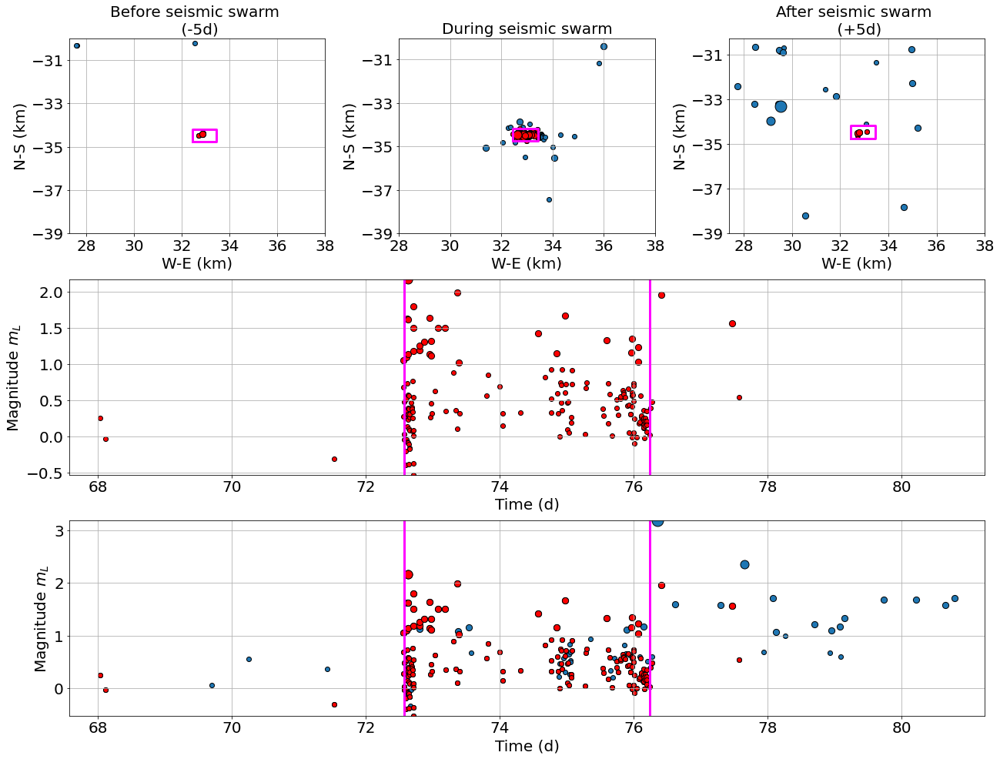

n° 8 :
(swarm) duration= 4.453408553265035 d
f_dist = 5 km


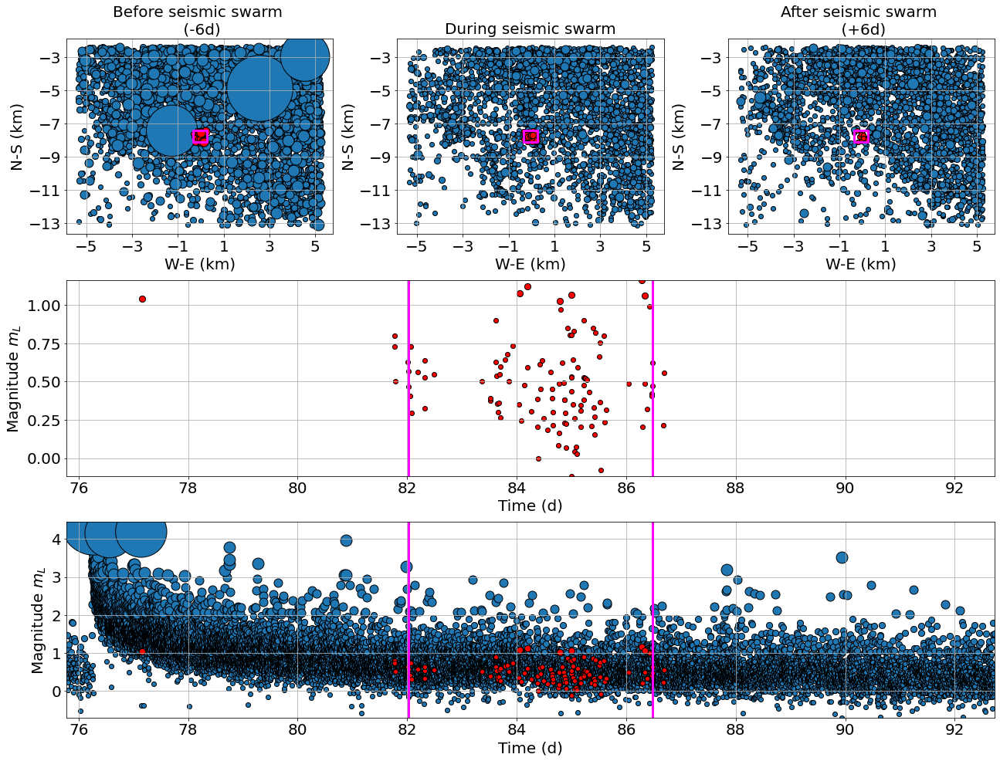

n° 9 :
(swarm) duration= 1.4171505671693012 d
f_dist = 5 km


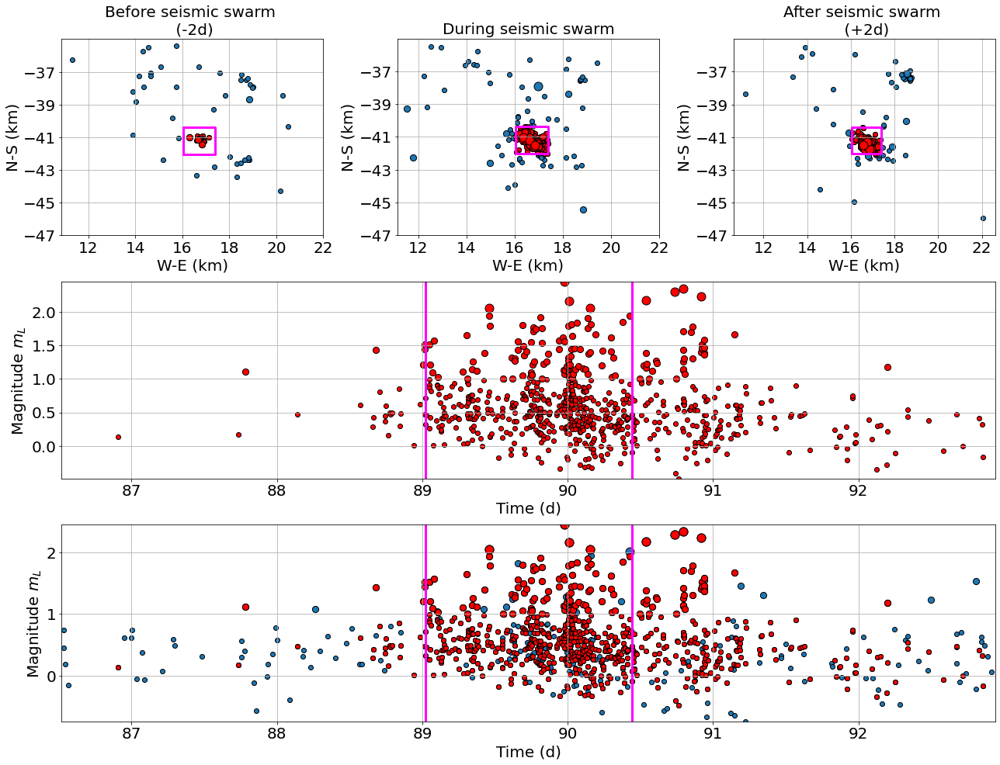

n° 10 :
(swarm) duration= 0.5002144213067368 d
f_dist = 5 km


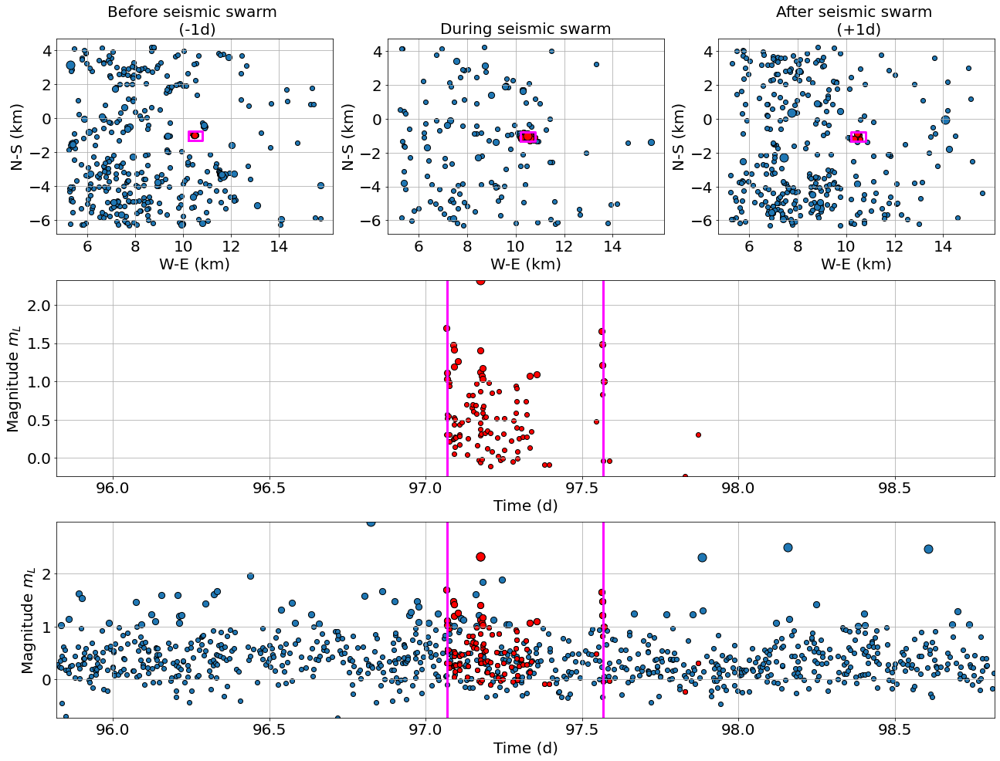

n° 11 :
(swarm) duration= 3.177170428214609 d
f_dist = 5 km


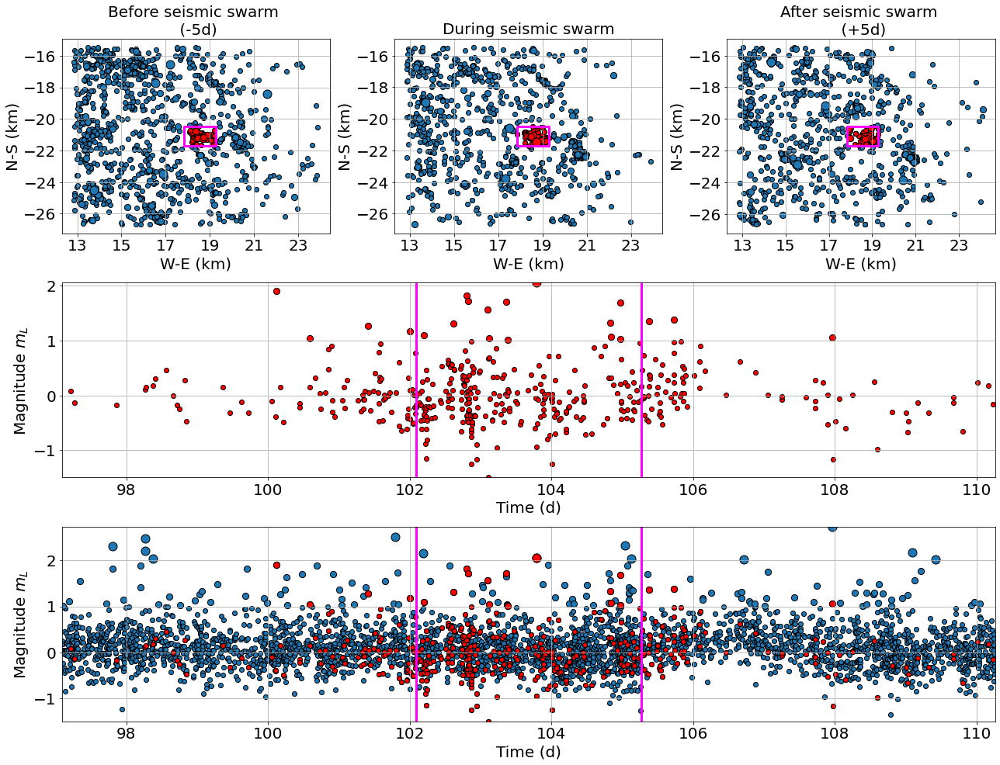

n° 12 :
(swarm) duration= 2.5538114930968874 d
f_dist = 5 km


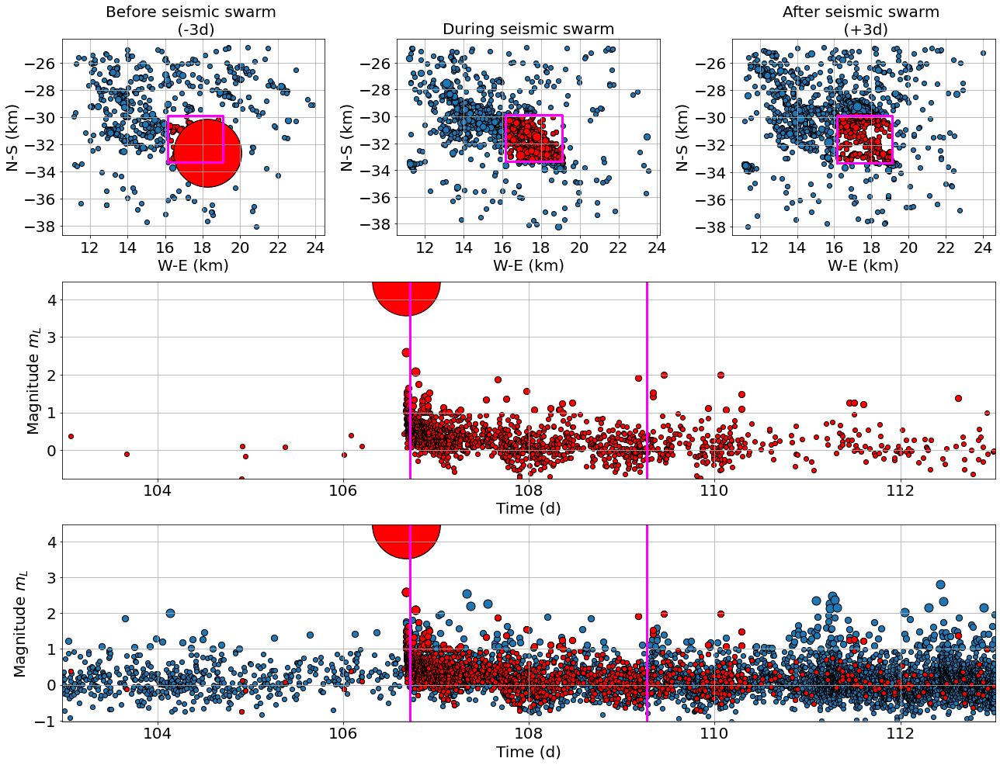

n° 13 :
(swarm) duration= 3.571011296240627 d
f_dist = 5 km


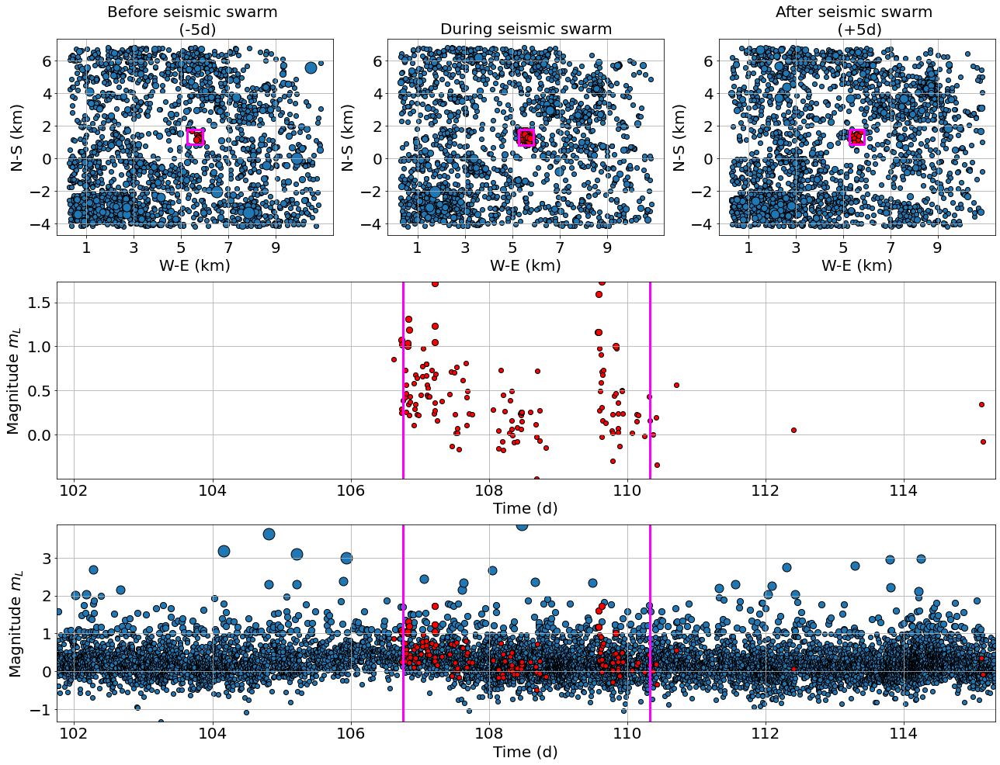

n° 14 :
(swarm) duration= 4.908696215366945 d
f_dist = 5 km


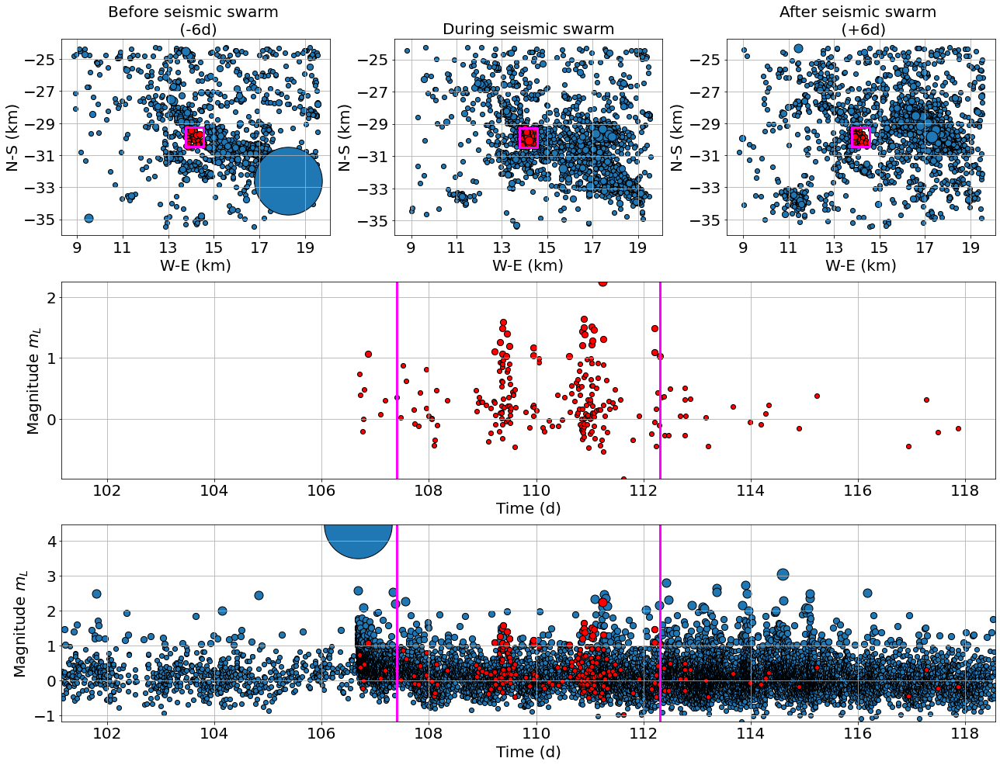

n° 15 :
(swarm) duration= 4.779835173627376 d
f_dist = 5 km


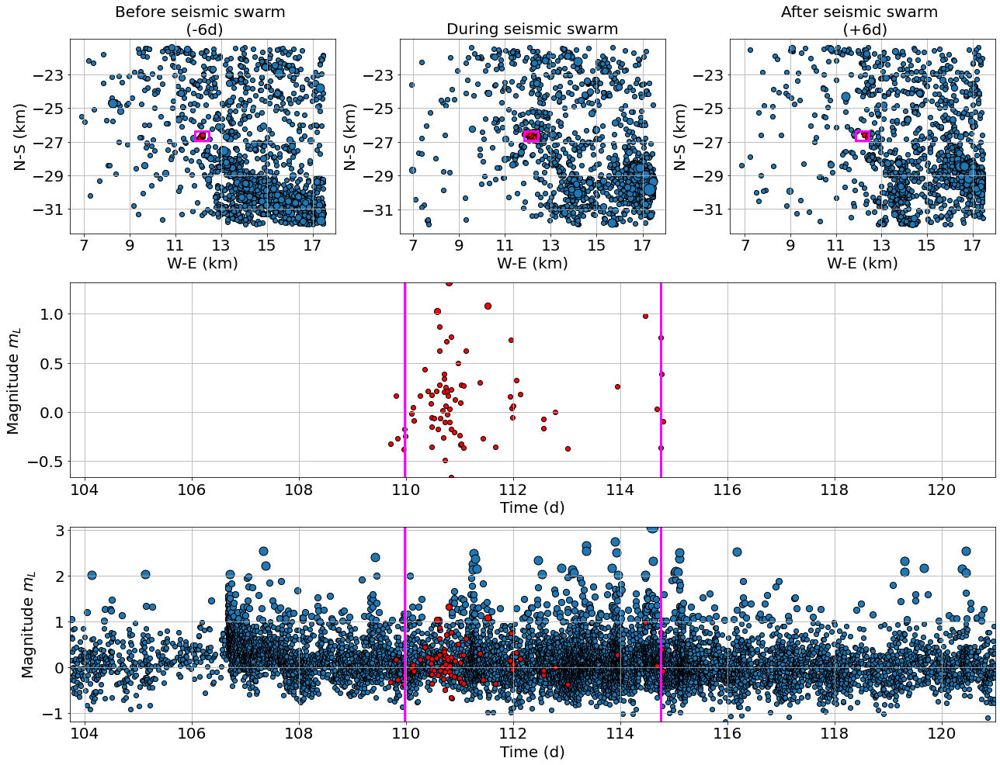

n° 16 :
(swarm) duration= 5.502016724552959 d
f_dist = 5 km


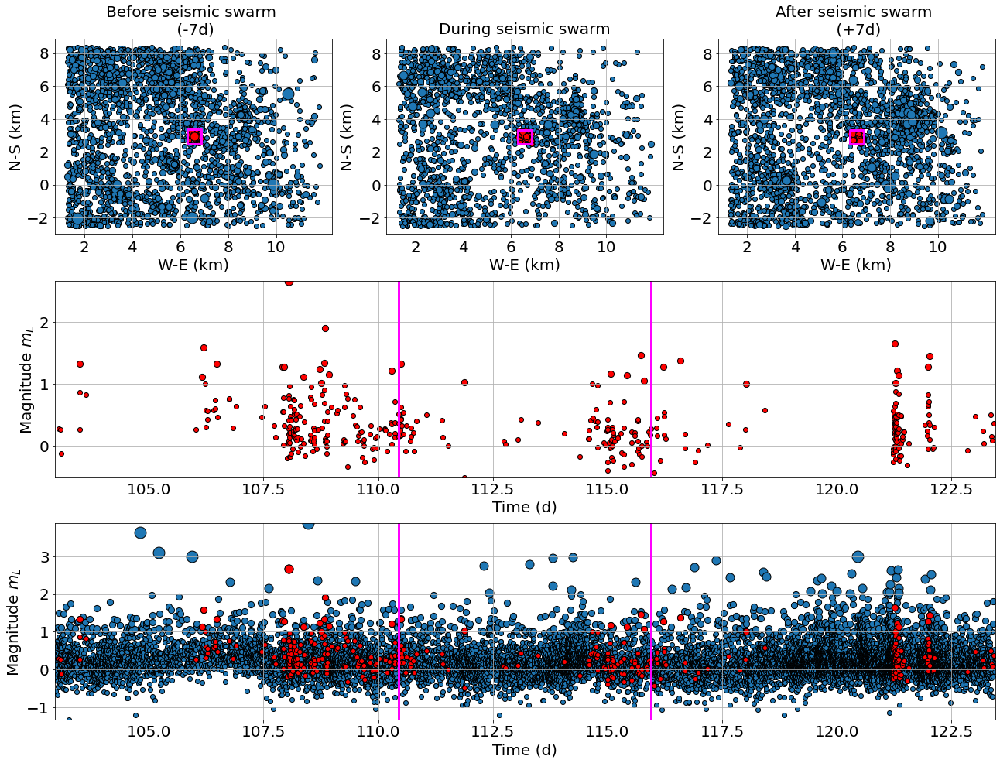

n° 17 :
(swarm) duration= 4.111264421255342 d
f_dist = 5 km


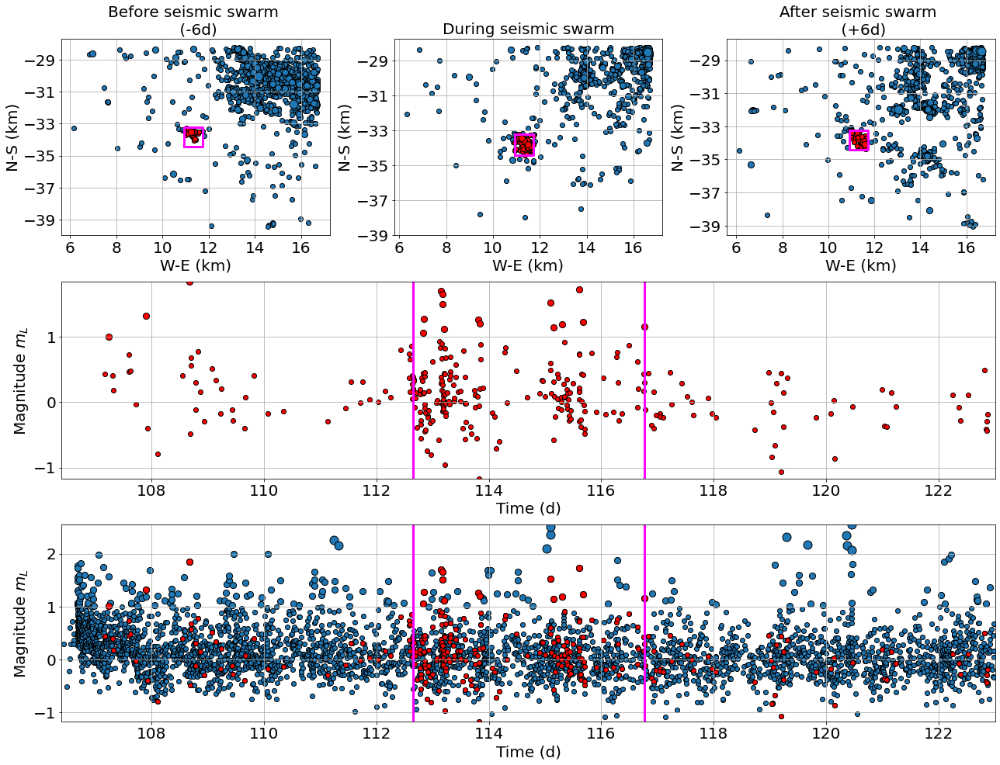

n° 18 :
(swarm) duration= 6.8566394676454365 d
f_dist = 5 km


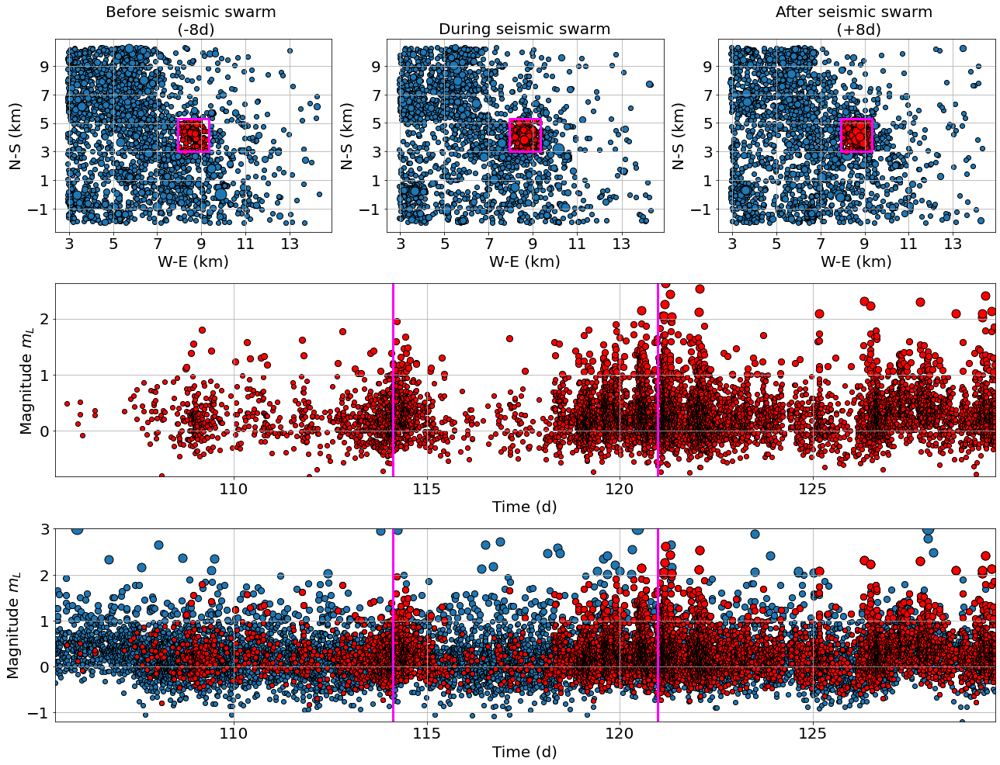

n° 19 :
(swarm) duration= 0.7222022106870725 d
f_dist = 5 km


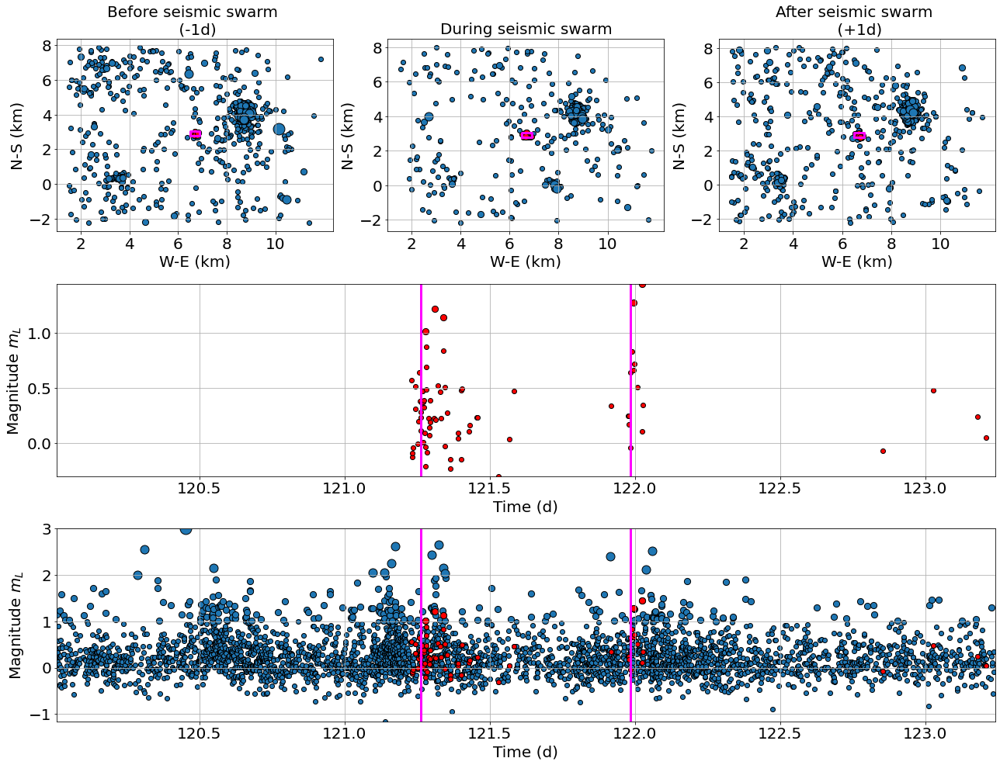

n° 20 :
(swarm) duration= 1.6528244792716436 d
f_dist = 5 km


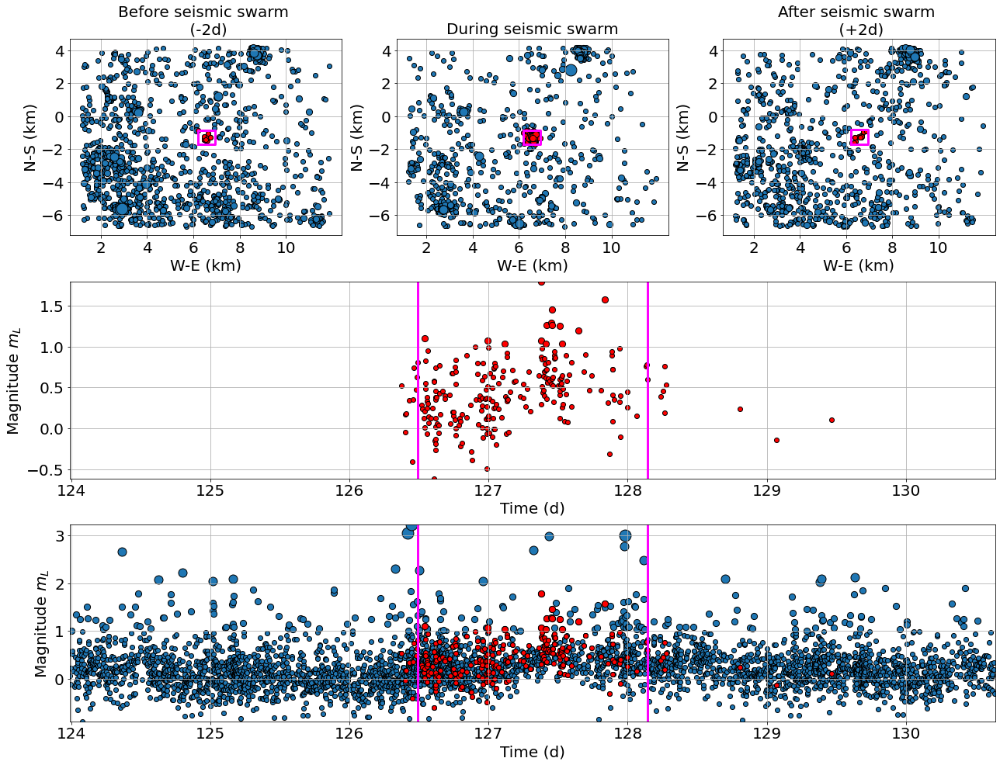

n° 21 :
(swarm) duration= 0.34159694449044764 d
f_dist = 5 km


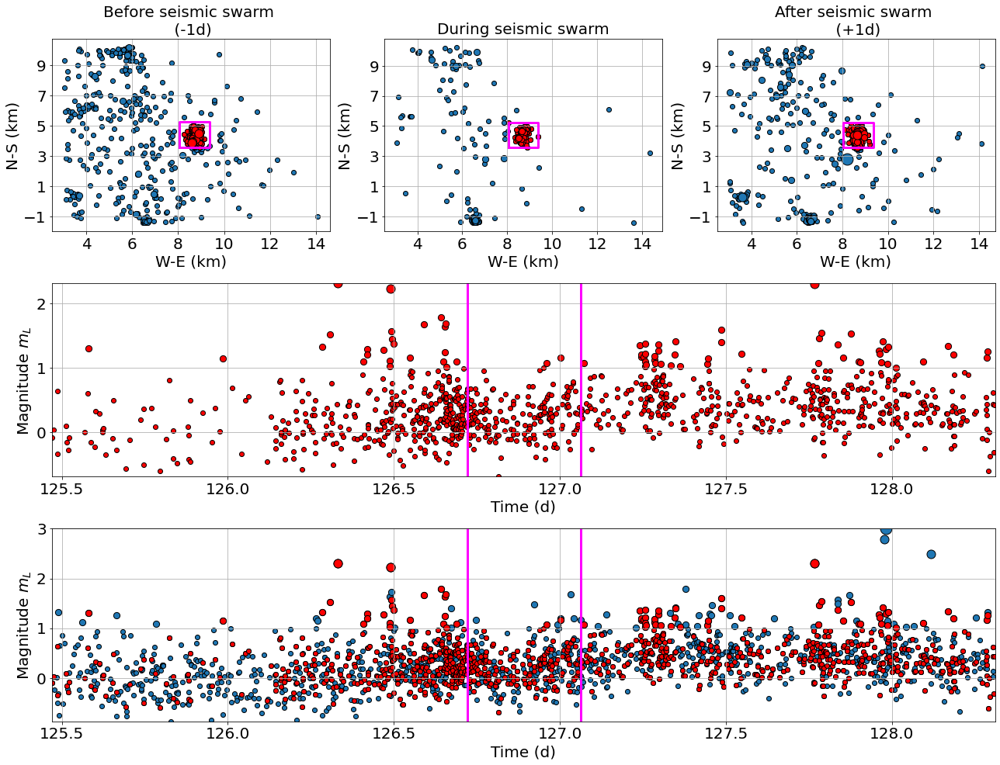

n° 22 :
(swarm) duration= 5.3327258449280635 d
f_dist = 5 km


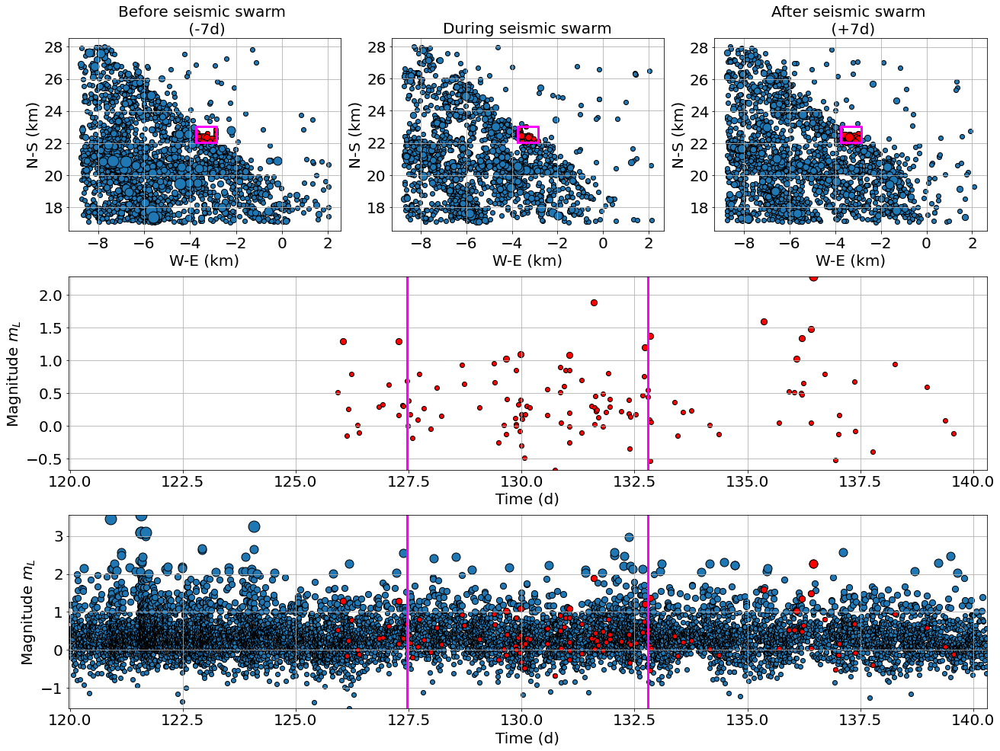

n° 23 :
(swarm) duration= 0.16216549777891487 d
f_dist = 5 km


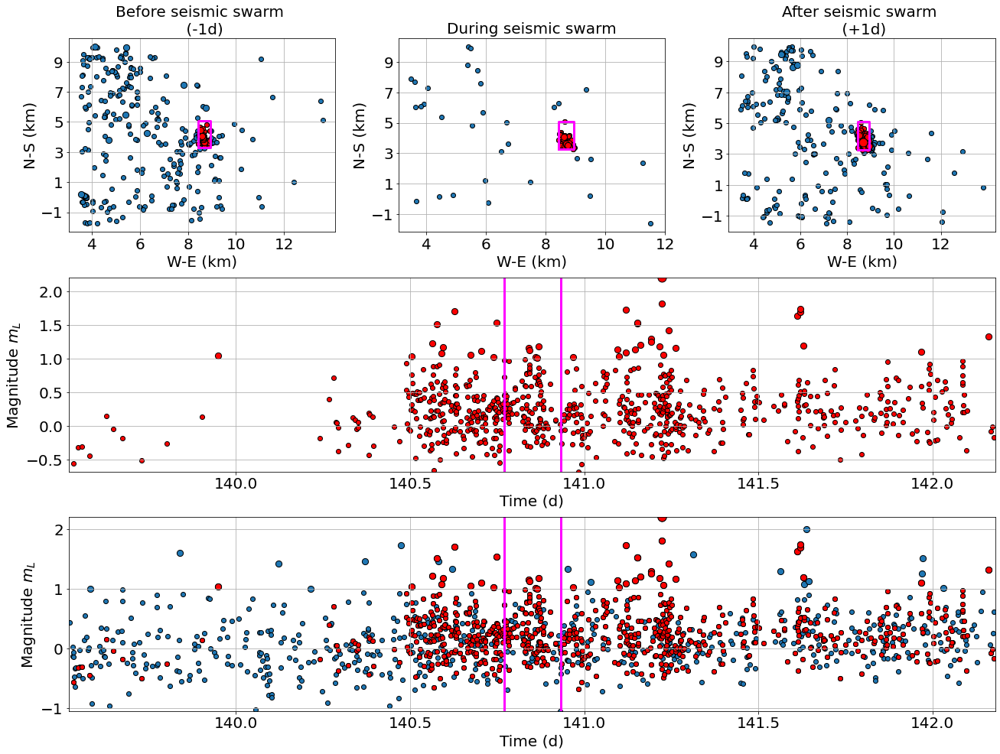

n° 24 :
(swarm) duration= 0.6888610532041639 d
f_dist = 5 km


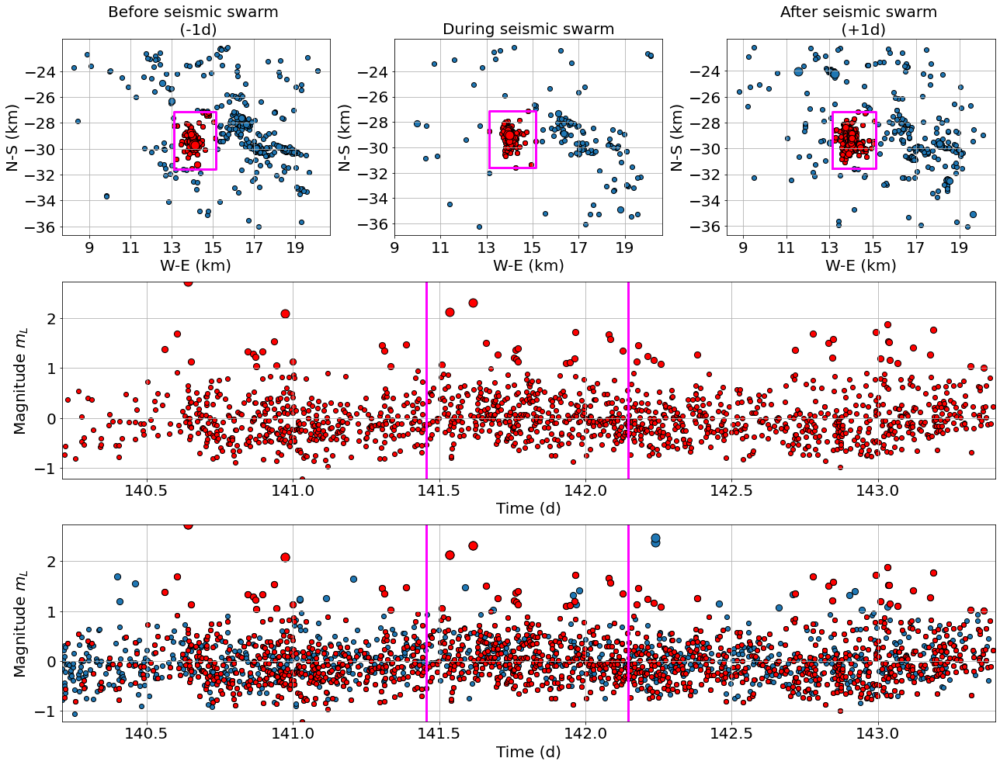

n° 25 :
(swarm) duration= 0.566211192170158 d
f_dist = 5 km


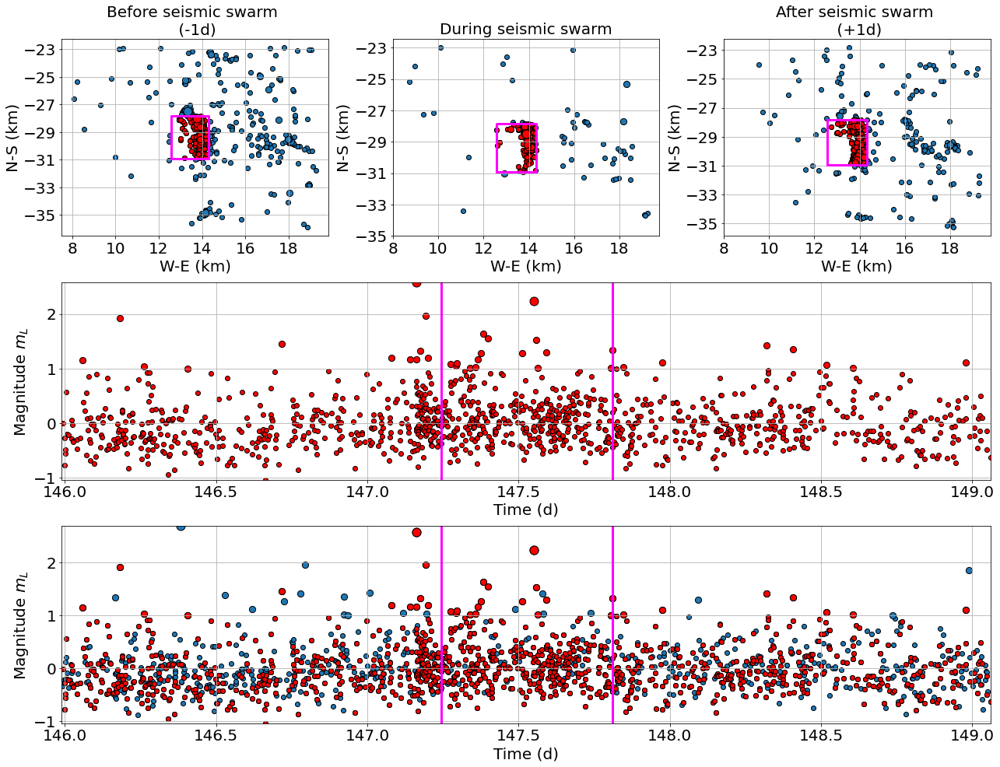

n° 26 :
(swarm) duration= 0.9028730092104809 d
f_dist = 5 km


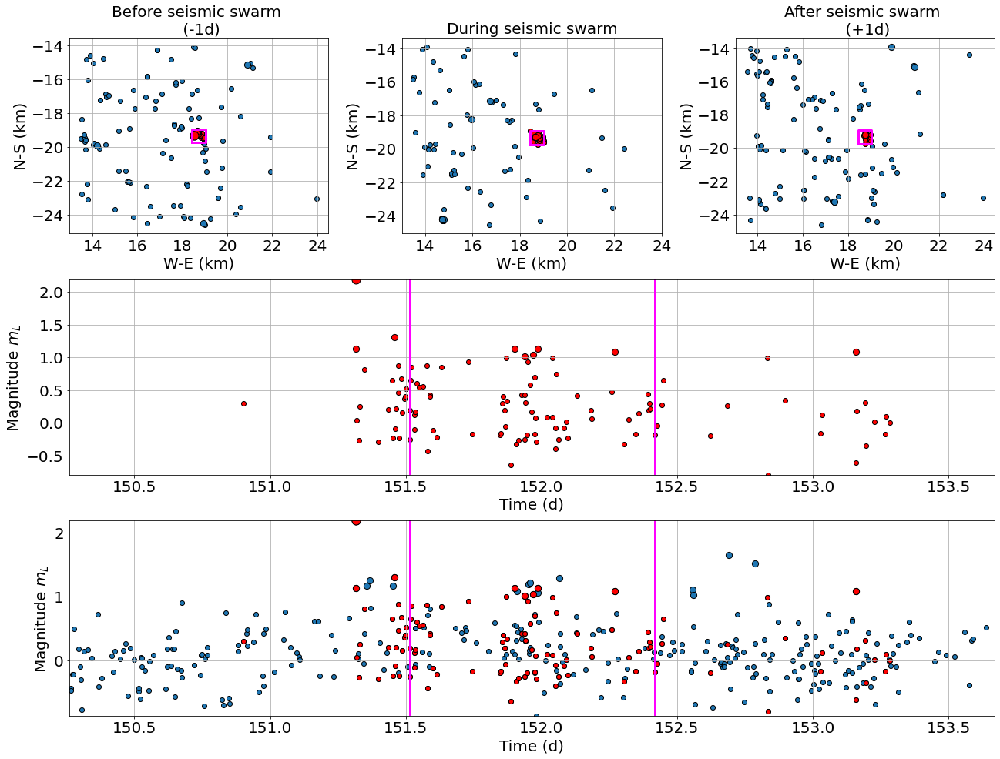

n° 27 :
(swarm) duration= 2.894760578754358 d
f_dist = 5 km


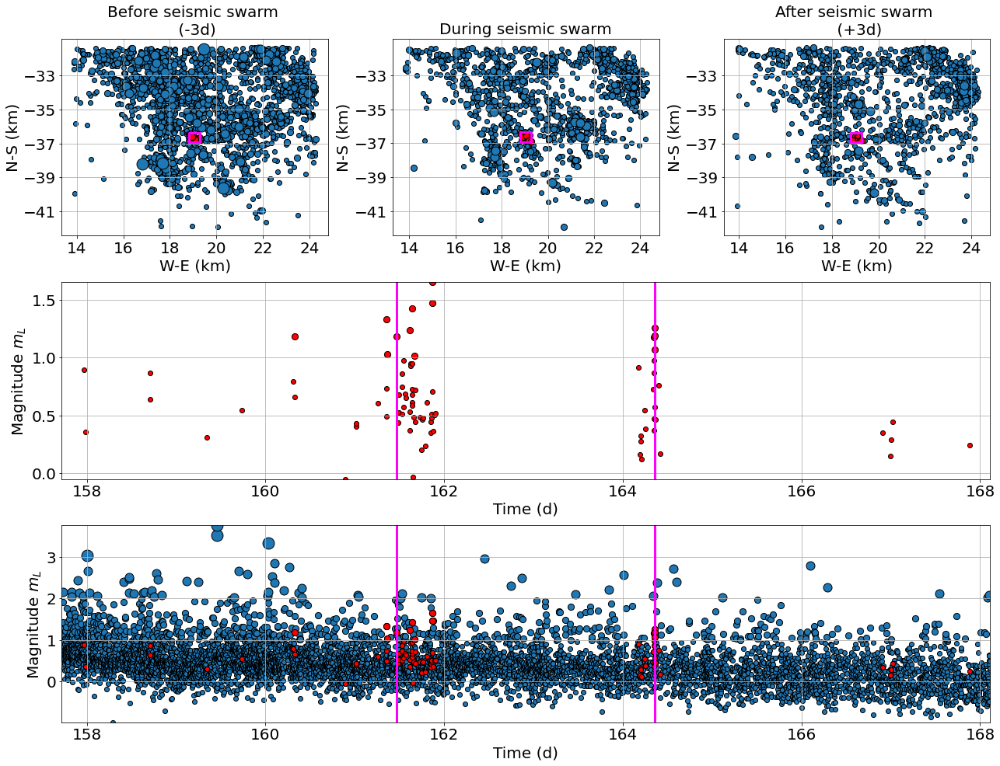

n° 28 :
(swarm) duration= 0.5933703009504825 d
f_dist = 5 km


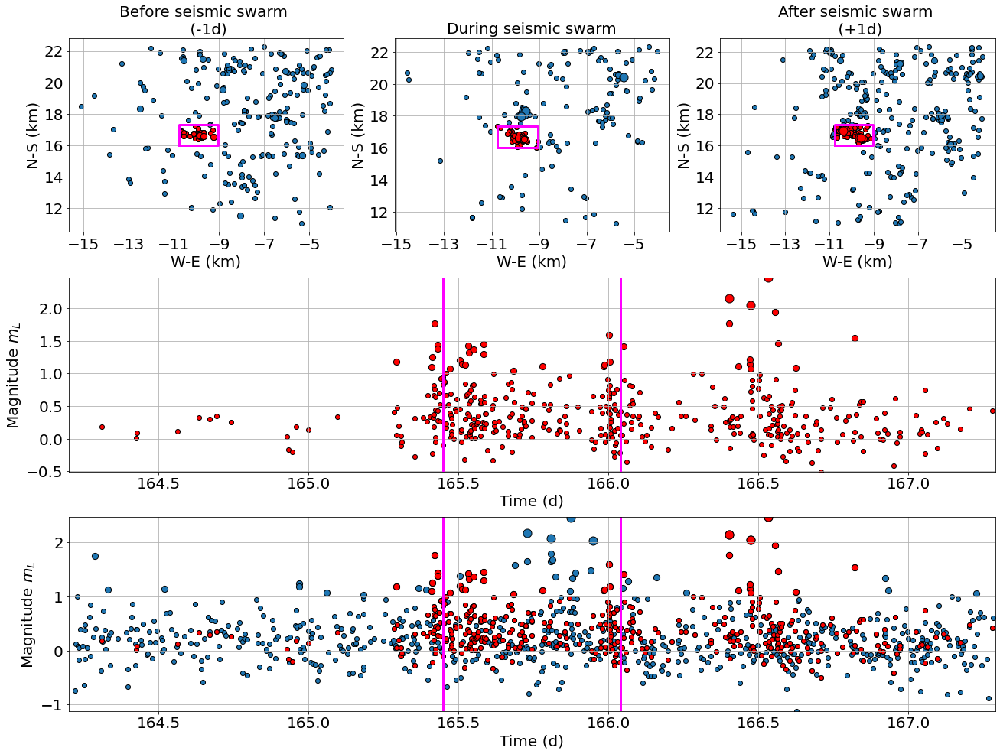

n° 29 :
(swarm) duration= 1.8106659722980396 d
f_dist = 5 km


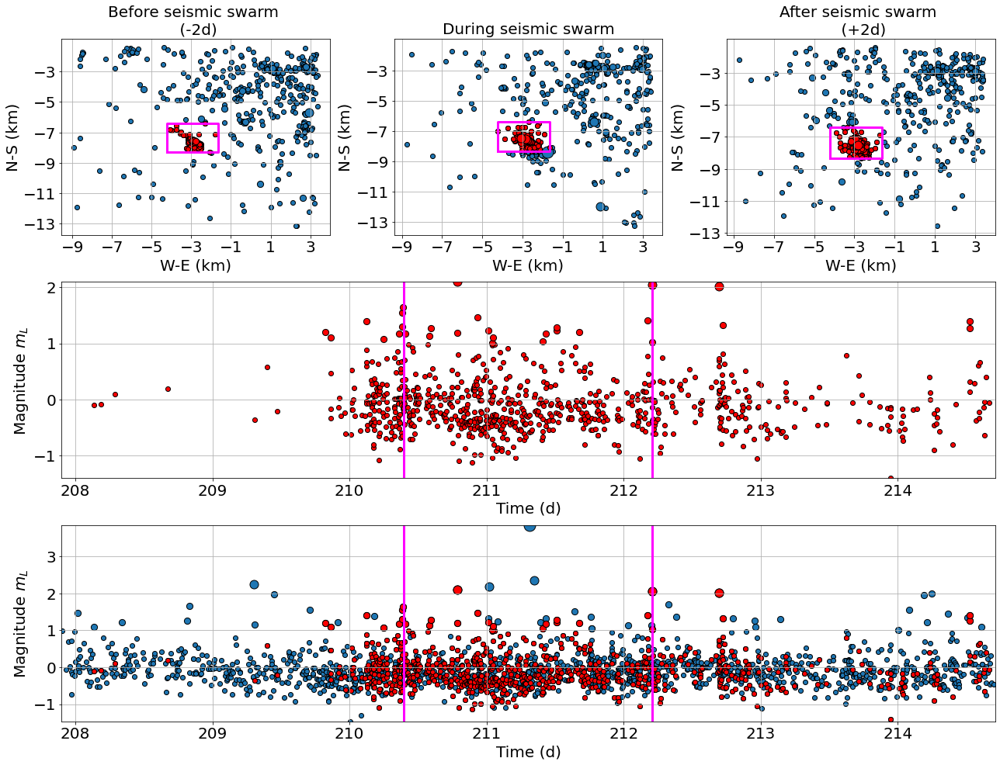

n° 30 :
(swarm) duration= 12.157379363430664 d
f_dist = 5 km


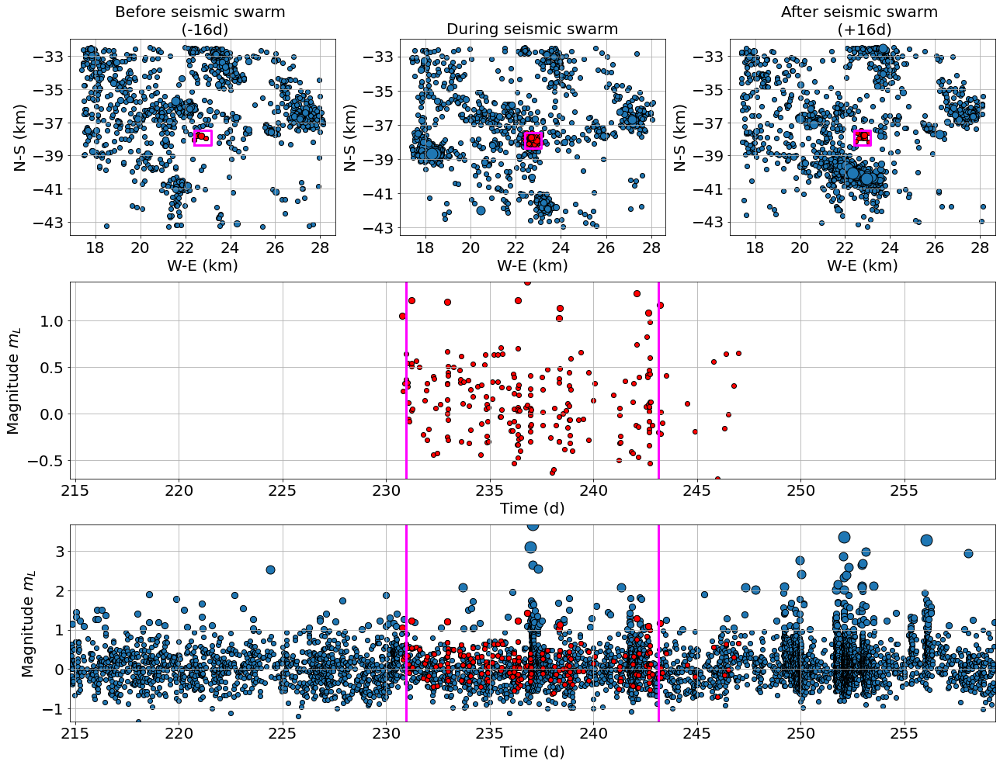

n° 31 :
(swarm) duration= 0.7973822801140784 d
f_dist = 5 km


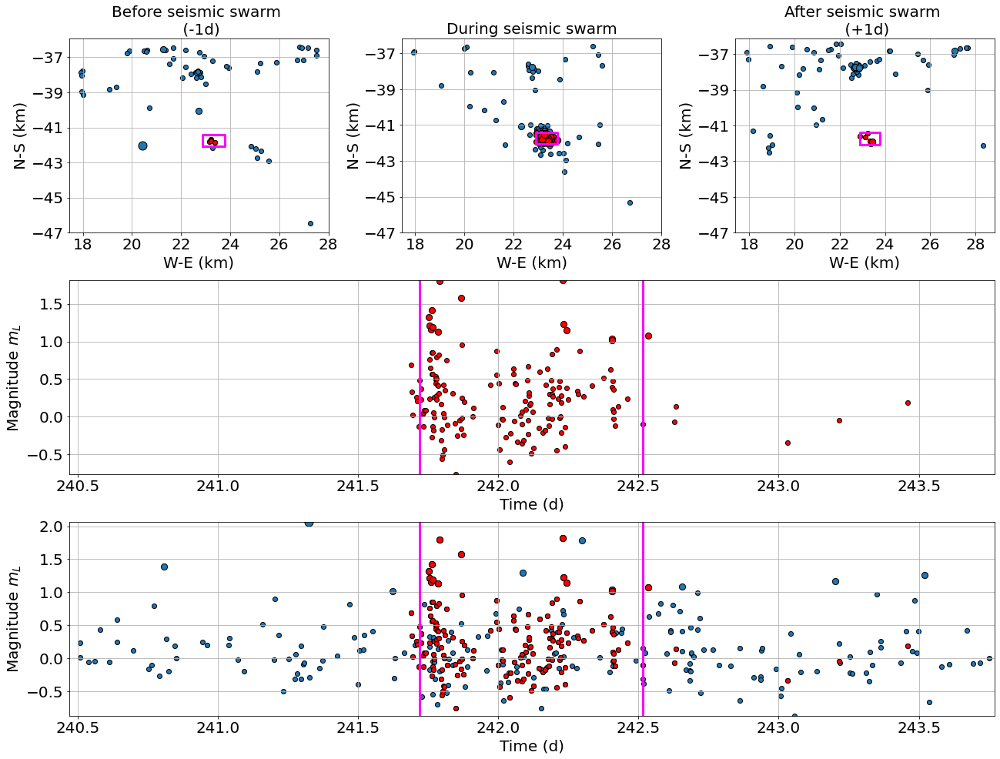

n° 32 :
(swarm) duration= 2.448999513871968 d
f_dist = 5 km


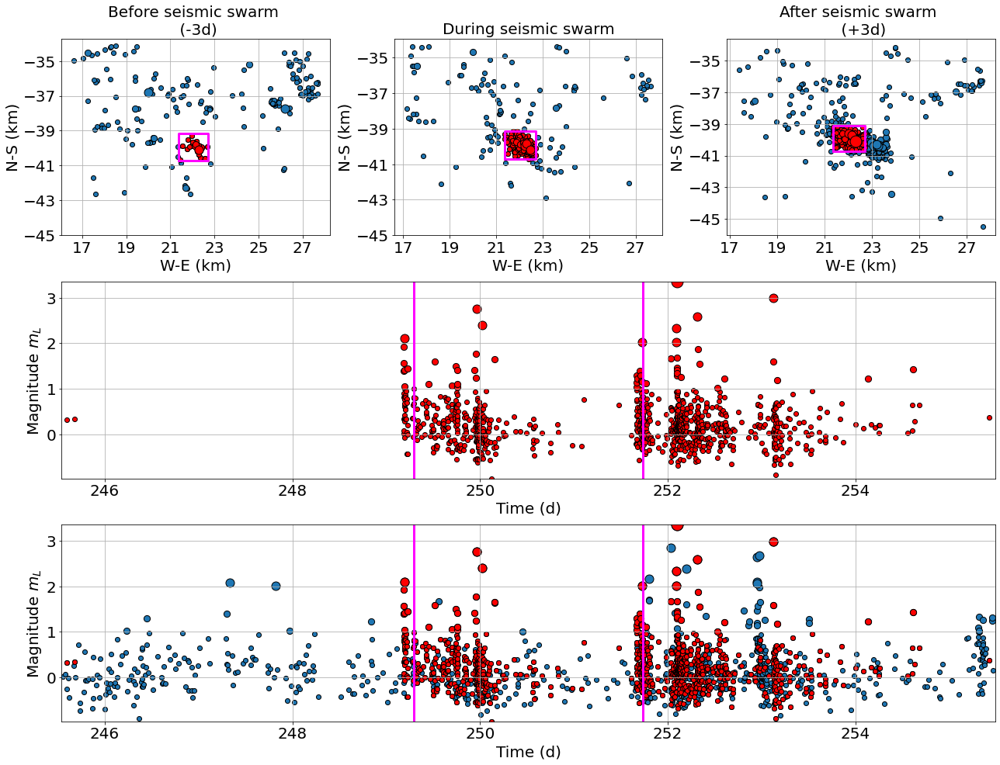

n° 33 :
(swarm) duration= 0.8044446065323427 d
f_dist = 5 km


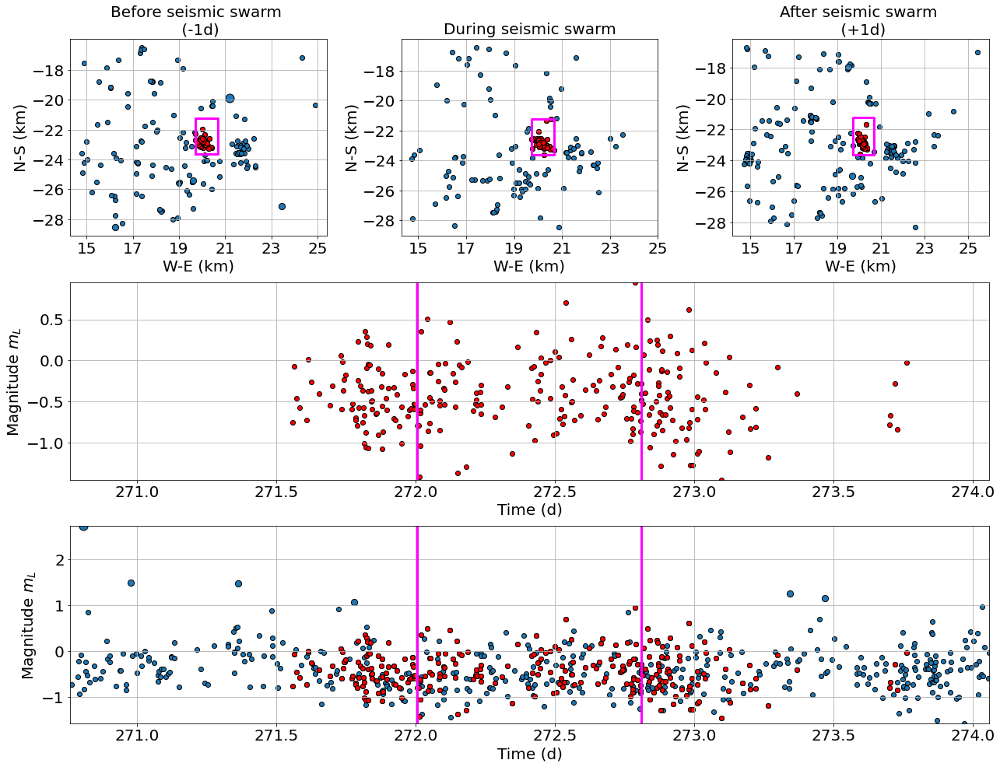

n° 34 :
(swarm) duration= 4.116860439768061 d
f_dist = 5 km


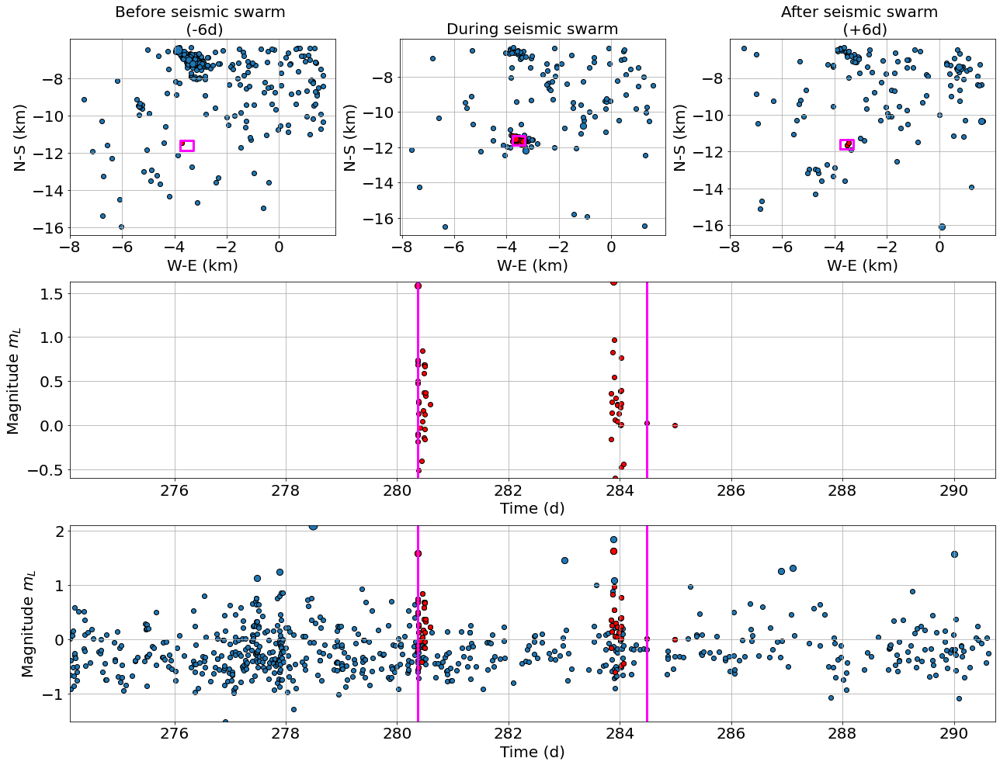

n° 35 :
(swarm) duration= 9.657339155091961 d
f_dist = 5 km


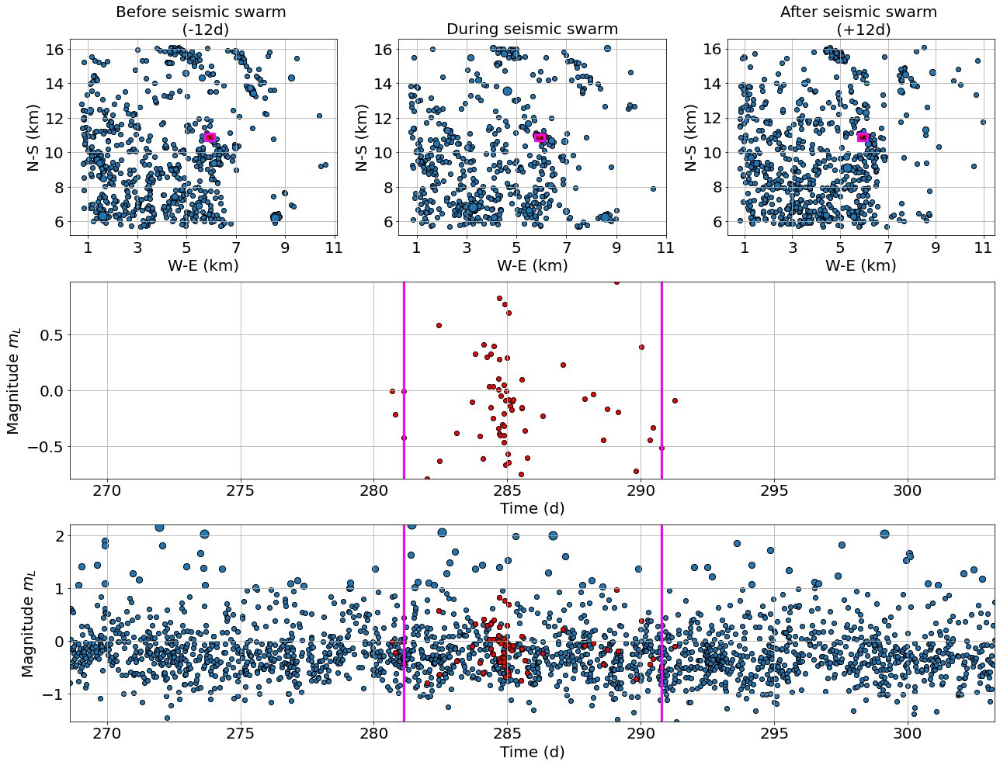

n° 36 :
(swarm) duration= 13.531546377344057 d
f_dist = 5 km


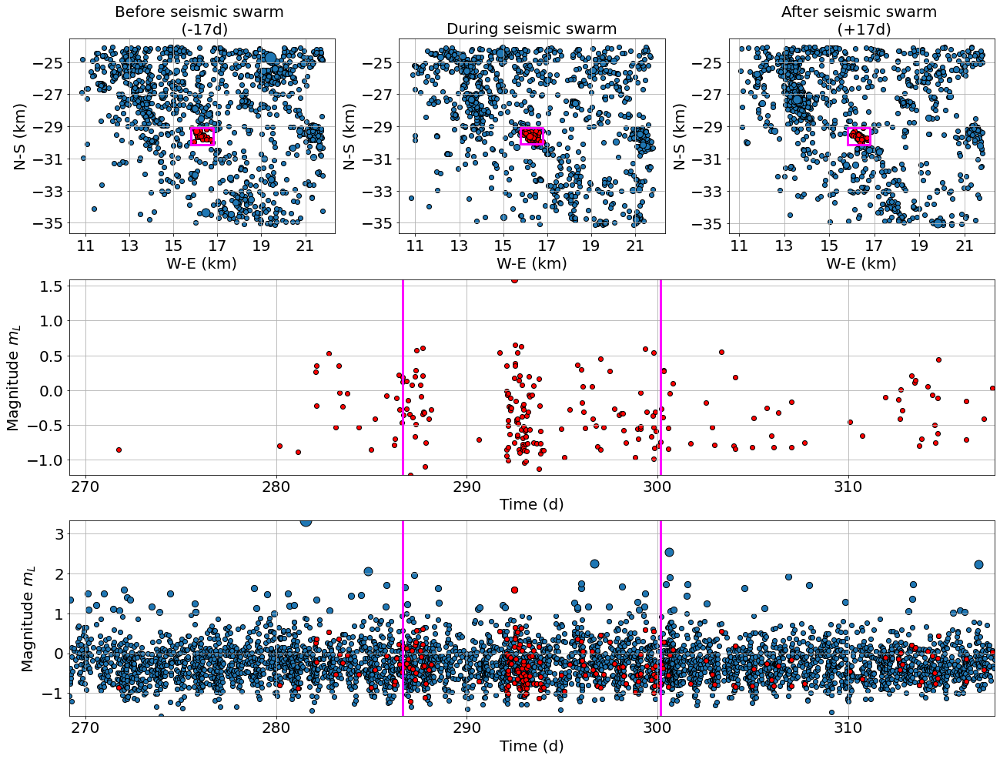

n° 37 :
(swarm) duration= 2.4509140509181293 d
f_dist = 5 km


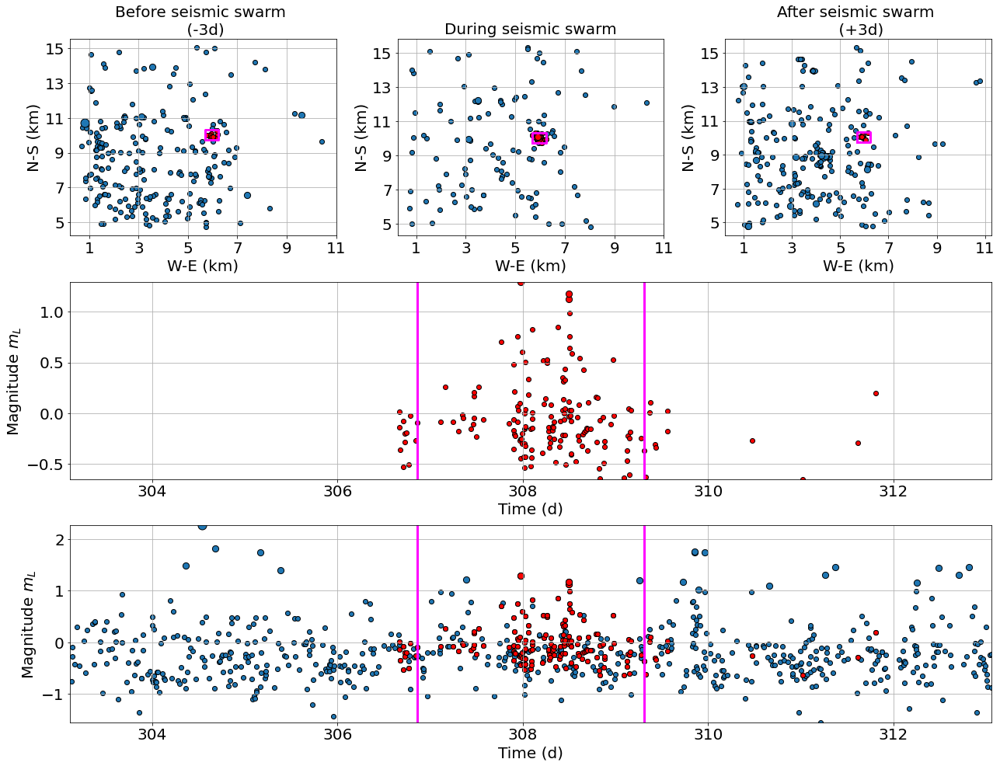

n° 38 :
(swarm) duration= 4.268550486187451 d
f_dist = 5 km


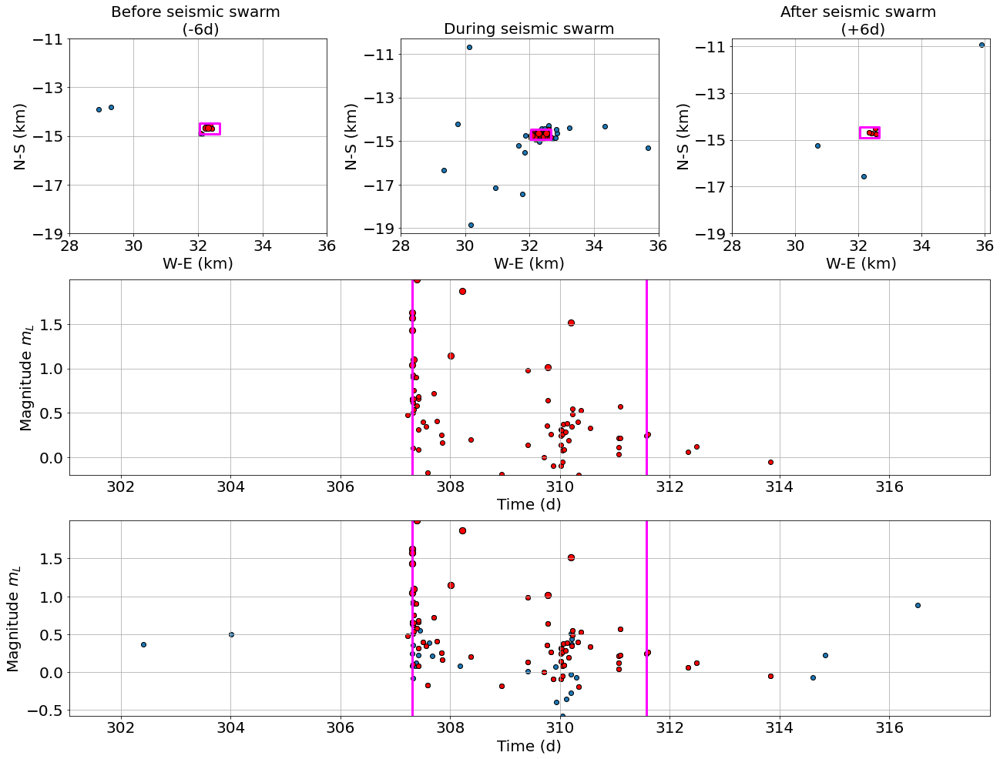

n° 39 :
(swarm) duration= 1.1174426736542955 d
f_dist = 5 km


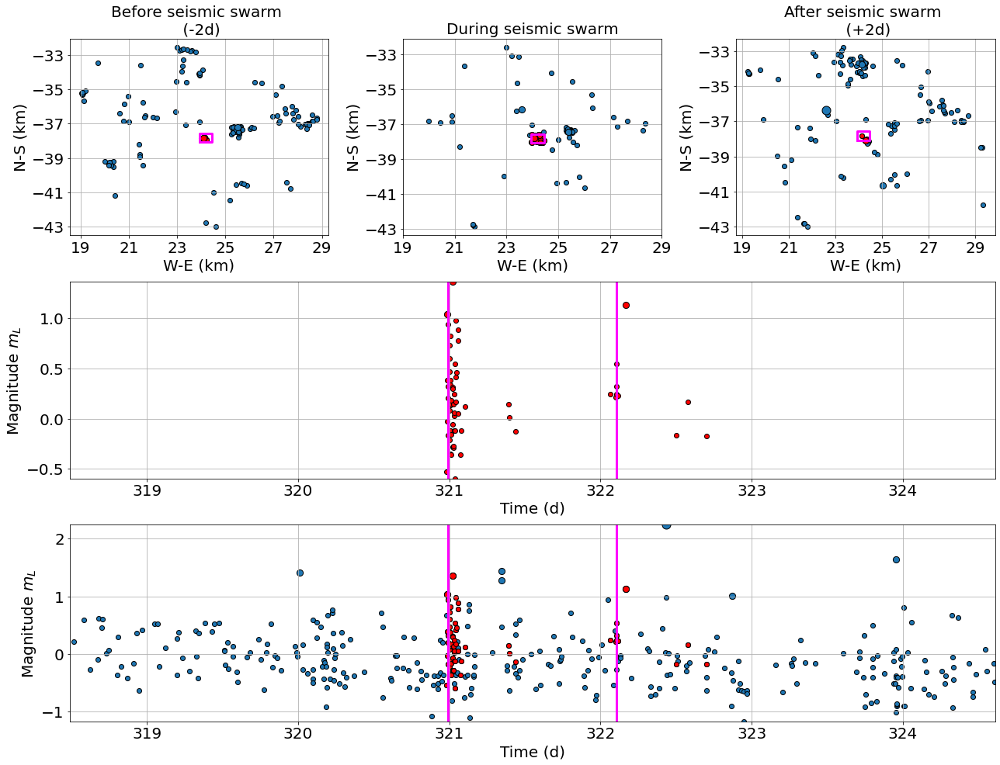

n° 40 :
(swarm) duration= 3.667519571725279 d
f_dist = 5 km


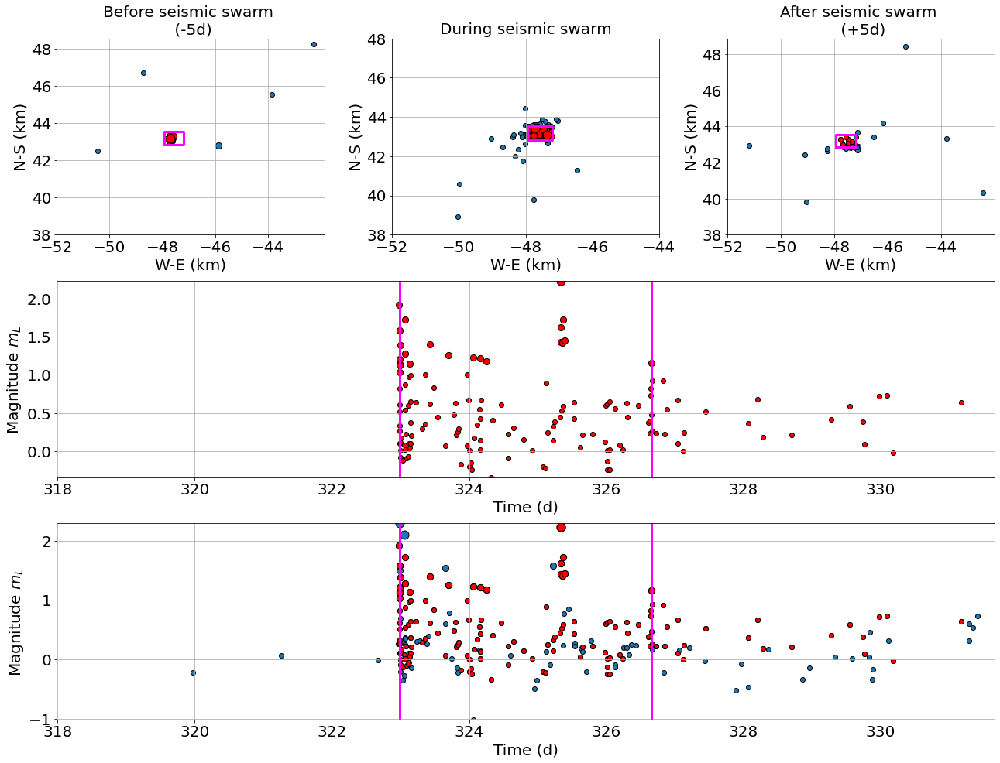

CPU times: user 1min 52s, sys: 1.74 s, total: 1min 54s
Wall time: 1min 54s


In [14]:
%%time

path = "/home/xianglo/Bureau/DATA_AMATRICE/DBSCAN_David/new_all_run_files_for_etas/v0_d03_n50_every1_clusters/fig_3maps_1magvst/"
if not os.path.exists(path):
    os.mkdir(path)

from matplotlib.patches import Polygon

print("max swarm =", np.max(np.unique(df0["swarms_num"])[1:]))

#
for num_swarm in np.unique(df0["swarms_num"])[1:]:
#for num_swarm in [12]:

    num_swarm = int(num_swarm) #start at 1 and no 0...
    print("n°", num_swarm, ":")

    ##Select swarm data:
    select_swarms = df0[df0.swarms_num == num_swarm]
    
    ##Associated dbscan cluster:
    num_dbscan = df_swarms[df_swarms.swarm_number == num_swarm].num_EQ.values[0]
        
    ##Compute centroid of swarm:
    centro = np.array([np.mean(select_swarms.t.values),
                           np.mean(select_swarms.yN_km.values),
                           np.mean(select_swarms.xN_km.values), 
                           np.mean(select_swarms.z.values)])

    ###Parameters:
    duration = select_swarms.t.max() - select_swarms.t.min()
    t = np.ceil(duration)*1.25 ##d
    f_dist = 5 ##km 
    print("(swarm) duration=", duration, "d")
    print("f_dist =", f_dist, "km")

    ##Compute distance between those EQ and the centroid of the swarm:
    EQ_m = df0[(df0.t >= round(select_swarms.t.min()-t, 2))&(df0.t <= round(select_swarms.t.max()+t, 2))]
    #EQ_m.sort_values(["t"], ascending=True, inplace=True)
    
    if EQ_m.empty == False:
        distances = np.sqrt((EQ_m.yN_km.values - centro[1])**2 + (EQ_m.xN_km.values - centro[2])**2 + (EQ_m.z.values - centro[3])**2) ##euclidean distance in km
    #Add distance data inside the table:
    df0_ = EQ_m.copy()
    df0_["d"] = distances

    ###Selection of EQ based on only x,y axis:
    ##Seismicity around the swarm along the time [swarm.t - t; swarm.t + t] AND space distances d < f_dist:
    background_t_and_xy = df0_[(df0_.t >= round(select_swarms.t.min()-t, 2))&(df0_.t <= round(select_swarms.t.max()+t, 2))
                                &(df0_.xN_km >= select_swarms.xN_km.min()-f_dist)&(df0_.xN_km <= select_swarms.xN_km.max()+f_dist)
                                &(df0_.yN_km >= select_swarms.yN_km.min()-f_dist)&(df0_.yN_km <= select_swarms.yN_km.max()+f_dist)]
    #[swarm.t - t; swarm.t] AND space distances (x,y) +/- f_dist:
    background_mt_and_xy = df0_[(df0_.t >= round(select_swarms.t.min()-t, 2))&(df0_.t < round(select_swarms.t.min(), 2))
                                &(df0_.xN_km >= select_swarms.xN_km.min()-f_dist)&(df0_.xN_km <= select_swarms.xN_km.max()+f_dist)
                                &(df0_.yN_km >= select_swarms.yN_km.min()-f_dist)&(df0_.yN_km <= select_swarms.yN_km.max()+f_dist)]
    #[swarm.t; swarm.t+t] AND space distances (x,y) +/- f_dist:
    background_pt_and_xy = df0_[(df0_.t > round(select_swarms.t.max(), 2))&(df0_.t <= round(select_swarms.t.max()+t, 2))
                                &(df0_.xN_km >= select_swarms.xN_km.min()-f_dist)&(df0_.xN_km <= select_swarms.xN_km.max()+f_dist)
                                &(df0_.yN_km >= select_swarms.yN_km.min()-f_dist)&(df0_.yN_km <= select_swarms.yN_km.max()+f_dist)]
    ##[swarm.t; swarm.t] AND space distances (x,y) +/- f_dist:
    background_dt_and_xy = df0_[(df0_.t >= round(select_swarms.t.min(), 2))&(df0_.t <= round(select_swarms.t.max(), 2))
                                &(df0_.xN_km >= select_swarms.xN_km.min()-f_dist)&(df0_.xN_km <= select_swarms.xN_km.max()+f_dist)
                                &(df0_.yN_km >= select_swarms.yN_km.min()-f_dist)&(df0_.yN_km <= select_swarms.yN_km.max()+f_dist)]
        
    ##Seismicity around ]#the swarm along the time [swarm.t - t; swarm.t] AND space distances (x,y) +/- f_dist:
    swarms_mt = background_mt_and_xy[(background_mt_and_xy.xN_km >= select_swarms.xN_km.min())&(background_mt_and_xy.xN_km <= select_swarms.xN_km.max())
        & (background_mt_and_xy.yN_km >= select_swarms.yN_km.min())&(background_mt_and_xy.yN_km <= select_swarms.yN_km.max())]
    #[swarm.t; swarm.t + t] AND space distances (x,y) +/- f_dist:
    swarms_pt = background_pt_and_xy[(background_pt_and_xy.xN_km >= select_swarms.xN_km.min())&(background_pt_and_xy.xN_km <= select_swarms.xN_km.max())
        & (background_pt_and_xy.yN_km >= select_swarms.yN_km.min())&(background_pt_and_xy.yN_km <= select_swarms.yN_km.max())]
    #[swarm.t; swarm.t] AND space distances (x,y) +/- f_dist:
    swarms_dt = background_dt_and_xy[(background_dt_and_xy.xN_km >= select_swarms.xN_km.min())&(background_dt_and_xy.xN_km <= select_swarms.xN_km.max())
        & (background_dt_and_xy.yN_km >= select_swarms.yN_km.min())&(background_dt_and_xy.yN_km <= select_swarms.yN_km.max())]

    ##Cluster along the time [swarm.t - t; swarm.t + t] and within the space constrain:
    swarms_t = df0_[(df0_.t >= round(select_swarms.t.min()-t, 2))&(df0.t <= round(select_swarms.t.max()+t, 2))
                  & (df0_.x >= select_swarms.x.min())&(df0_.x <= select_swarms.x.max())
                  & (df0_.y >= select_swarms.y.min())&(df0_.y <= select_swarms.y.max())
                  & (df0_.z >= select_swarms.z.min())&(df0_.z <= select_swarms.z.max())]
    
    
    plt.figure(figsize=(18,15))

    ##Plot magnitude along the time:
    ax1 = plt.subplot(312)

    ##Concerning seismicity inside the square:
    select_df_m = swarms_t[swarms_t.m < 1]
    if select_df_m.empty == False:
        ax1.scatter(select_df_m.t, select_df_m.m, s=np.exp(1.2*3), c="red", edgecolors='k')
    select_df_m = swarms_t[(swarms_t.m >= 1)&(swarms_t.m < 2)]
    if select_df_m.empty == False:
        ax1.scatter(select_df_m.t, select_df_m.m, s=np.exp(1.4*3), c="red", edgecolors='k')
    select_df_m = swarms_t[(swarms_t.m >= 2)&(swarms_t.m < 3)]
    if select_df_m.empty == False:
        ax1.scatter(select_df_m.t, select_df_m.m, s=np.exp(1.6*3), c="red", edgecolors='k')
    select_df_m = swarms_t[(swarms_t.m >= 3)&(swarms_t.m < 4)]    
    if select_df_m.empty == False:
        ax1.scatter(select_df_m.t, select_df_m.m, s=np.exp(1.8*3), c="red", edgecolors='k')
    select_df_m = swarms_t[swarms_t.m >= 4]
    if select_df_m.empty == False:
        ax1.scatter(select_df_m.t, select_df_m.m, s=np.exp(2*select_df_m.m), c = "red", edgecolors='k')
 
    ax1.axvline(select_swarms.t.min(), c='magenta', linewidth=3, ls='-')#, label= correct_label+' delimitation')
    ax1.axvline(select_swarms.t.max(), c='magenta', linewidth=3, ls='-')

    ax1.set_xlabel("Time (d)", fontsize=20)
    ax1.set_ylabel("Magnitude $m_L$", fontsize=20)
    ax1.tick_params(axis='both',labelsize=20)
    ax1.set_xlim(round(select_swarms.t.min()-t, 2), round(select_swarms.t.max()+t, 2))
    ax1.set_ylim(swarms_t.m.min(), swarms_t.m.max())
    ax1.grid(True)
    
    ax2 = plt.subplot(313)

    ##Concerning background seismicity:
    select_df_m = background_t_and_xy[background_t_and_xy.m < 1]
    if select_df_m.empty == False:
        ax2.scatter(select_df_m.t, select_df_m.m, s=np.exp(1.2*3), c="tab:blue", edgecolors='k')
    select_df_m = background_t_and_xy[(background_t_and_xy.m >= 1)&(background_t_and_xy.m < 2)]
    if select_df_m.empty == False:
        ax2.scatter(select_df_m.t, select_df_m.m, s=np.exp(1.4*3), c="tab:blue", edgecolors='k')
    select_df_m = background_t_and_xy[(background_t_and_xy.m >= 2)&(background_t_and_xy.m < 3)]
    if select_df_m.empty == False:
        ax2.scatter(select_df_m.t, select_df_m.m, s=np.exp(1.6*3), c="tab:blue", edgecolors='k')
    select_df_m = background_t_and_xy[(background_t_and_xy.m >= 3)&(background_t_and_xy.m < 4)]    
    if select_df_m.empty == False:
        ax2.scatter(select_df_m.t, select_df_m.m, s=np.exp(1.8*3), c="tab:blue", edgecolors='k')
    select_df_m = background_t_and_xy[background_t_and_xy.m >= 4]
    if select_df_m.empty == False:
        ax2.scatter(select_df_m.t, select_df_m.m, s=np.exp(2*select_df_m.m), c = "tab:blue", edgecolors='k')
    
    ##Concerning seismicity inside the square:
    select_df_m = swarms_t[swarms_t.m < 1]
    if select_df_m.empty == False:
        ax2.scatter(select_df_m.t, select_df_m.m, s=np.exp(1.2*3), c="red", edgecolors='k')
    select_df_m = swarms_t[(swarms_t.m >= 1)&(swarms_t.m < 2)]
    if select_df_m.empty == False:
        ax2.scatter(select_df_m.t, select_df_m.m, s=np.exp(1.4*3), c="red", edgecolors='k')
    select_df_m = swarms_t[(swarms_t.m >= 2)&(swarms_t.m < 3)]
    if select_df_m.empty == False:
        ax2.scatter(select_df_m.t, select_df_m.m, s=np.exp(1.6*3), c="red", edgecolors='k')
    select_df_m = swarms_t[(swarms_t.m >= 3)&(swarms_t.m < 4)]    
    if select_df_m.empty == False:
        ax2.scatter(select_df_m.t, select_df_m.m, s=np.exp(1.8*3), c="red", edgecolors='k')
    select_df_m = swarms_t[swarms_t.m >= 4]
    if select_df_m.empty == False:
        ax2.scatter(select_df_m.t, select_df_m.m, s=np.exp(2*select_df_m.m), c = "red", edgecolors='k')
    
    ax2.axvline(select_swarms.t.min(), c='magenta', linewidth=3, ls='-')#, label= correct_label+' delimitation')
    ax2.axvline(select_swarms.t.max(), c='magenta', linewidth=3, ls='-')

    ax2.set_xlabel("Time (d)", fontsize=20)
    ax2.set_ylabel("Magnitude $m_L$", fontsize=20)
    ax2.tick_params(axis='both',labelsize=20)
    ax2.set_xlim(round(select_swarms.t.min()-t, 2), round(select_swarms.t.max()+t, 2))
    ax2.set_ylim(background_t_and_xy.m.min(), background_t_and_xy.m.max())
    ax2.grid(True)

    ##3 Plots type map:
    #t_i - t:
    ax3 = plt.subplot(331)
    ##Concerning background seismicity at -t days:
    select_df_m = background_mt_and_xy[background_mt_and_xy.m < 1]
    if select_df_m.empty == False:
        ax3.scatter(select_df_m.yN_km, select_df_m.xN_km, s=np.exp(1.2*3), c="tab:blue", edgecolors='k')
    select_df_m = background_mt_and_xy[(background_mt_and_xy.m >= 1)&(background_mt_and_xy.m < 2)]
    if select_df_m.empty == False:
        ax3.scatter(select_df_m.yN_km, select_df_m.xN_km, s=np.exp(1.4*3), c="tab:blue", edgecolors='k')
    select_df_m = background_mt_and_xy[(background_mt_and_xy.m >= 2)&(background_mt_and_xy.m < 3)]
    if select_df_m.empty == False:
        ax3.scatter(select_df_m.yN_km, select_df_m.xN_km, s=np.exp(1.6*3), c="tab:blue", edgecolors='k')
    select_df_m = background_mt_and_xy[(background_mt_and_xy.m >= 3)&(background_mt_and_xy.m < 4)]    
    if select_df_m.empty == False:
        ax3.scatter(select_df_m.yN_km, select_df_m.xN_km, s=np.exp(1.8*3), c="tab:blue", edgecolors='k')
    select_df_m = background_mt_and_xy[background_mt_and_xy.m >= 4]
    if select_df_m.empty == False:
        ax3.scatter(select_df_m.yN_km, select_df_m.xN_km, s=np.exp(2*select_df_m.m), c = "tab:blue", edgecolors='k')

    ##Concerning seismicity inside the square at -t days:
    select_df_m = swarms_mt[swarms_mt.m < 1]
    if select_df_m.empty == False:
        ax3.scatter(select_df_m.yN_km, select_df_m.xN_km, s=np.exp(1.2*3), c="red", edgecolors='k')
    select_df_m = swarms_mt[(swarms_mt.m >= 1)&(swarms_mt.m < 2)]
    if select_df_m.empty == False:
        ax3.scatter(select_df_m.yN_km, select_df_m.xN_km, s=np.exp(1.4*3), c="red", edgecolors='k')
    select_df_m = swarms_mt[(swarms_mt.m >= 2)&(swarms_mt.m < 3)]
    if select_df_m.empty == False:
        ax3.scatter(select_df_m.yN_km, select_df_m.xN_km, s=np.exp(1.6*3), c="red", edgecolors='k')
    select_df_m = swarms_mt[(swarms_mt.m >= 3)&(swarms_mt.m < 4)]    
    if select_df_m.empty == False:
        ax3.scatter(select_df_m.yN_km, select_df_m.xN_km, s=np.exp(1.8*3), c="red", edgecolors='k')
    select_df_m = swarms_mt[swarms_mt.m >= 4]
    if select_df_m.empty == False:
        ax3.scatter(select_df_m.yN_km, select_df_m.xN_km, s=np.exp(2*select_df_m.m), c = "red", edgecolors='k')
 
    #ax3.scatter(centro[1], centro[2], marker="*", c="gold", s=300)
    ax3.plot([select_swarms.yN_km.min(), select_swarms.yN_km.max(), select_swarms.yN_km.max(), select_swarms.yN_km.min(), select_swarms.yN_km.min()],
            [select_swarms.xN_km.min(), select_swarms.xN_km.min(), select_swarms.xN_km.max(), select_swarms.xN_km.max(), select_swarms.xN_km.min()],
            c='magenta', linewidth=3, ls='-')
    ax3.set_title('Before seismic swarm \n (-'+str(int(t))+'d)', fontsize=20)
    ax3.set_xlabel("W-E (km)", fontsize=20)
    ax3.set_ylabel("N-S (km)", fontsize=20)
    ax3.set_xticks(np.arange(np.ceil(select_swarms.yN_km.min()-f_dist), np.ceil(select_swarms.yN_km.max()+f_dist),2))
    ax3.set_yticks(np.arange(np.ceil(select_swarms.xN_km.min()-f_dist), np.ceil(select_swarms.xN_km.max()+f_dist),2))
    ax3.tick_params(axis='both',labelsize=20)
    ax3.grid(True)

    #t_i:
    ax4 = plt.subplot(332)
    ##Concerning background seismicity at t days:
    select_df_m = background_dt_and_xy[background_dt_and_xy.m < 1]
    if select_df_m.empty == False:
        ax4.scatter(select_df_m.yN_km, select_df_m.xN_km, s=np.exp(1.2*3), c="tab:blue", edgecolors='k')
    select_df_m = background_dt_and_xy[(background_dt_and_xy.m >= 1)&(background_dt_and_xy.m < 2)]
    if select_df_m.empty == False:
        ax4.scatter(select_df_m.yN_km, select_df_m.xN_km, s=np.exp(1.4*3), c="tab:blue", edgecolors='k')
    select_df_m = background_dt_and_xy[(background_dt_and_xy.m >= 2)&(background_dt_and_xy.m < 3)]
    if select_df_m.empty == False:
        ax4.scatter(select_df_m.yN_km, select_df_m.xN_km, s=np.exp(1.6*3), c="tab:blue", edgecolors='k')
    select_df_m = background_dt_and_xy[(background_dt_and_xy.m >= 3)&(background_dt_and_xy.m < 4)]    
    if select_df_m.empty == False:
        ax4.scatter(select_df_m.yN_km, select_df_m.xN_km, s=np.exp(1.8*3), c="tab:blue", edgecolors='k')
    select_df_m = background_dt_and_xy[background_dt_and_xy.m >= 4]
    if select_df_m.empty == False:
        ax4.scatter(select_df_m.yN_km, select_df_m.xN_km, s=np.exp(2*select_df_m.m), c = "tab:blue", edgecolors='k')

    ##Concerning seismicity inside the square at t days:
    select_df_m = swarms_dt[swarms_dt.m < 1]
    if select_df_m.empty == False:
        ax4.scatter(select_df_m.yN_km, select_df_m.xN_km, s=np.exp(1.2*3), c="red", edgecolors='k')
    select_df_m = swarms_dt[(swarms_dt.m >= 1)&(swarms_dt.m < 2)]
    if select_df_m.empty == False:
        ax4.scatter(select_df_m.yN_km, select_df_m.xN_km, s=np.exp(1.4*3), c="red", edgecolors='k')
    select_df_m = swarms_dt[(swarms_dt.m >= 2)&(swarms_dt.m < 3)]
    if select_df_m.empty == False:
        ax4.scatter(select_df_m.yN_km, select_df_m.xN_km, s=np.exp(1.6*3), c="red", edgecolors='k')
    select_df_m = swarms_dt[(swarms_dt.m >= 3)&(swarms_dt.m < 4)]    
    if select_df_m.empty == False:
        ax4.scatter(select_df_m.yN_km, select_df_m.xN_km, s=np.exp(1.8*3), c="red", edgecolors='k')
    select_df_m = swarms_dt[swarms_dt.m >= 4]
    if select_df_m.empty == False:
        ax4.scatter(select_df_m.yN_km, select_df_m.xN_km, s=np.exp(2*select_df_m.m), c = "red", edgecolors='k')

    #ax4.scatter(centro[1], centro[2], marker="*", c="gold", s=300)
    ax4.plot([select_swarms.yN_km.min(), select_swarms.yN_km.max(), select_swarms.yN_km.max(), select_swarms.yN_km.min(), select_swarms.yN_km.min()],
            [select_swarms.xN_km.min(), select_swarms.xN_km.min(), select_swarms.xN_km.max(), select_swarms.xN_km.max(), select_swarms.xN_km.min()],
            c='magenta', linewidth=3, ls='-')
    ax4.set_title('During seismic swarm', fontsize=20)
    ax4.set_xlabel("W-E (km)", fontsize=20)
    ax4.set_ylabel("N-S (km)", fontsize=20)
    ax4.set_xticks(np.arange(np.ceil(select_swarms.yN_km.min()-f_dist), np.ceil(select_swarms.yN_km.max()+f_dist),2))
    ax4.set_yticks(np.arange(np.ceil(select_swarms.xN_km.min()-f_dist), np.ceil(select_swarms.xN_km.max()+f_dist),2))
    ax4.tick_params(axis='both',labelsize=20)
    ax4.grid(True)

    #t_i + t:
    ax5 = plt.subplot(333)
    ##Concerning background seismicity at +t days:
    select_df_m = background_pt_and_xy[background_pt_and_xy.m < 1]
    if select_df_m.empty == False:
        ax5.scatter(select_df_m.yN_km, select_df_m.xN_km, s=np.exp(1.2*3), c="tab:blue", edgecolors='k')
    select_df_m = background_pt_and_xy[(background_pt_and_xy.m >= 1)&(background_pt_and_xy.m < 2)]
    if select_df_m.empty == False:
        ax5.scatter(select_df_m.yN_km, select_df_m.xN_km, s=np.exp(1.4*3), c="tab:blue", edgecolors='k')
    select_df_m = background_pt_and_xy[(background_pt_and_xy.m >= 2)&(background_pt_and_xy.m < 3)]
    if select_df_m.empty == False:
        ax5.scatter(select_df_m.yN_km, select_df_m.xN_km, s=np.exp(1.6*3), c="tab:blue", edgecolors='k')
    select_df_m = background_pt_and_xy[(background_pt_and_xy.m >= 3)&(background_pt_and_xy.m < 4)]    
    if select_df_m.empty == False:
        ax5.scatter(select_df_m.yN_km, select_df_m.xN_km, s=np.exp(1.8*3), c="tab:blue", edgecolors='k')
    select_df_m = background_pt_and_xy[background_pt_and_xy.m >= 4]
    if select_df_m.empty == False:
        ax5.scatter(select_df_m.yN_km, select_df_m.xN_km, s=np.exp(2*select_df_m.m), c = "tab:blue", edgecolors='k')
    
    ##Concerning seismicity inside the square at +t days:
    select_df_m = swarms_pt[swarms_pt.m < 1]
    if select_df_m.empty == False:
        ax5.scatter(select_df_m.yN_km, select_df_m.xN_km, s=np.exp(1.2*3), c="red", edgecolors='k')
    select_df_m = swarms_pt[(swarms_pt.m >= 1)&(swarms_pt.m < 2)]
    if select_df_m.empty == False:
        ax5.scatter(select_df_m.yN_km, select_df_m.xN_km, s=np.exp(1.4*3), c="red", edgecolors='k')
    select_df_m = swarms_pt[(swarms_pt.m >= 2)&(swarms_pt.m < 3)]
    if select_df_m.empty == False:
        ax5.scatter(select_df_m.yN_km, select_df_m.xN_km, s=np.exp(1.6*3), c="red", edgecolors='k')
    select_df_m = swarms_pt[(swarms_pt.m >= 3)&(swarms_pt.m < 4)]    
    if select_df_m.empty == False:
        ax5.scatter(select_df_m.yN_km, select_df_m.xN_km, s=np.exp(1.8*3), c="red", edgecolors='k')
    select_df_m = swarms_pt[swarms_pt.m >= 4]
    if select_df_m.empty == False:
        ax5.scatter(select_df_m.yN_km, select_df_m.xN_km, s=np.exp(2*select_df_m.m), c = "red", edgecolors='k')

    #ax5.scatter(centro[1], centro[2], marker="*", c="gold", s=300)
    ax5.plot([select_swarms.yN_km.min(), select_swarms.yN_km.max(), select_swarms.yN_km.max(), select_swarms.yN_km.min(), select_swarms.yN_km.min()],
            [select_swarms.xN_km.min(), select_swarms.xN_km.min(), select_swarms.xN_km.max(), select_swarms.xN_km.max(), select_swarms.xN_km.min()],
            c='magenta', linewidth=3, ls='-')
    ax5.set_title('After seismic swarm \n (+'+str(int(t))+'d)', fontsize=20)
    ax5.set_xlabel("W-E (km)", fontsize=20)
    ax5.set_ylabel("N-S (km)", fontsize=20)
    ax5.set_xticks(np.arange(np.ceil(select_swarms.yN_km.min()-f_dist), np.ceil(select_swarms.yN_km.max()+f_dist),2))
    ax5.set_yticks(np.arange(np.ceil(select_swarms.xN_km.min()-f_dist), np.ceil(select_swarms.xN_km.max()+f_dist),2))
    ax5.tick_params(axis='both',labelsize=20)
    ax5.grid(True)
    
    ##Get the right swarm name:
    if num_swarm == 12:
        correct_swarm_name = str("A")
        correct_label = 'Candidate swarm n°'+str(correct_swarm_name)
    else:
        correct_swarm_name = df_stats.swarm_number.iloc[num_swarm]
        correct_label = 'Swarm n°'+str(correct_swarm_name)
    
    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    #plt.savefig("/home/xianglo/Bureau/DATA_AMATRICE/DBSCAN_David/new_all_run_files_for_etas/v0_d03_n50_every1_clusters/fig_3maps_1magvst/swarm"+str(correct_swarm_name)+".png")
    plt.show()

## Cumulative seismic swarms along time:

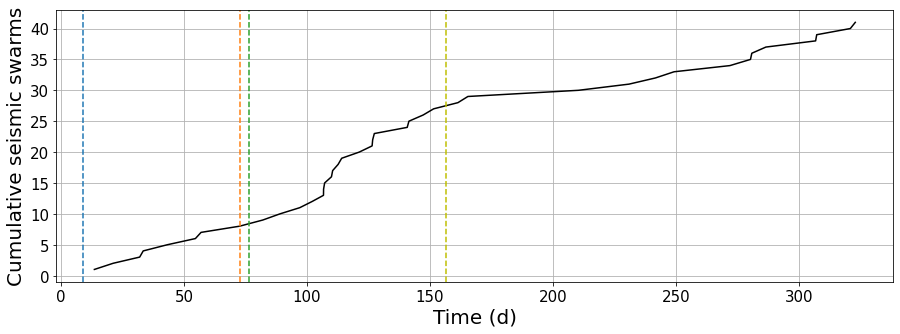

In [38]:
plt.figure(figsize=(15,5))
plt.plot(df_swarms.t1, df_swarms.swarm_number+1, c='k') ##+1 pour commencer à numérotation 1
plt.axvline(x=A.t, ls='--', c='tab:blue', label="Amatrice seismic event")
plt.axvline(x=V.t, ls='--', c='tab:orange', label="Visso seismic event")
plt.axvline(x=N.t, ls='--', c='tab:green', label="Norcia seismic event")
plt.axvline(x=C.t.iloc[0], ls='--', c='y', label="Campotosto seismic events")
plt.xlabel('Time (d)', fontsize=20)
plt.ylabel('Cumulative seismic swarms', fontsize=20)
plt.tick_params(labelsize=15)
#plt.legend(loc="lower right", fontsize=15)
plt.grid()
plt.savefig("v0_d03_n50_every1_clusters/cumul_seismic_swarms.png")
plt.show()